In [1]:
###########import packages##########
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import sklearn
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn import ensemble
from sklearn.tree import ExtraTreeRegressor
from sklearn import svm
from sklearn import neighbors
from sklearn import tree
from sklearn import ensemble
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score
from sklearn.model_selection import LeaveOneOut
seed=5647 
###########import packages##########
import catboost
import xgboost
import lightgbm
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import *
import pickle
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import  *
###########import packages##########
import tensorflow as tf
import keras
from keras import optimizers
from keras import regularizers
from keras import backend as K
from keras.callbacks import EarlyStopping
from keras.callbacks import TensorBoard
from keras.constraints import max_norm
from keras.models import Sequential 
from keras.layers import Dense 
from keras.layers import Dropout 
from keras.models import Model
from keras.layers import BatchNormalization
from keras.wrappers.scikit_learn import KerasClassifier 
from keras.wrappers.scikit_learn import KerasRegressor
from keras.constraints import maxnorm 
# from keras.wrappers import scikit_learn
from scikeras.wrappers import KerasClassifier, KerasRegressor
###########loading data##########
loo = LeaveOneOut()
# %matplotlib



In [2]:
###########wrapping root mean square error for later calls##########
def compute_mae_mse_rmse(target,prediction):
    error = []
    for i in range(len(target)):
        error.append(target[i] - prediction[i])
    squaredError = []
    absError = []
    for val in error:
        squaredError.append(val * val)  # target-prediction之差平方
        absError.append(abs(val))  # 误差绝对值
    mae=sum(absError)/len(absError)  # 平均绝对误差MAE
    mse=sum(squaredError)/len(squaredError)  # 均方误差MSE
    RMSE=np.sqrt(sum(squaredError)/len(squaredError))
    R2=r2_score(target,prediction)
    return mae,mse,RMSE,R2
def gridsearch(model,param,algorithm_name,X_train,y_train,X_test,y_test):
    grid = GridSearchCV(model,param_grid=param,scoring='neg_mean_absolute_error',cv=10,n_jobs=8,verbose=-1)
    grid.fit(X_train,y_train)
    best_model=grid.best_estimator_
    ####Train####
    prediction_train = best_model.predict(X_train)
    real_train=y_train.values
    prediction_train_series=pd.Series(prediction_train)
    real_train_series=pd.Series(real_train)
    corr_ann_train = round(prediction_train_series.corr(real_train_series), 5)
    error_val_train= compute_mae_mse_rmse(prediction_train,real_train)
    ####test####
    prediction_test = best_model.predict(X_test)
    real_test=y_test.values
    prediction_test_series=pd.Series(prediction_test)
    real_test_series=pd.Series(real_test)
    corr_ann_test = round(prediction_test_series.corr(real_test_series), 5)
    error_val_test= compute_mae_mse_rmse(prediction_test,real_test)
    print(algorithm_name)
    best_score=grid.best_score_
    print('Best Regressor:',grid.best_params_,'Best Score:', best_score)
    print(error_val_train)
    print(error_val_test)
    print('R2 TEST',error_val_test[3])
    fig=plt.figure()
    ax = fig.add_subplot(111)
    x_y_x=np.arange(100,1500,0.01)
    x_y_y=np.arange(100,1500,0.01)
    ax.scatter(prediction_train,real_train,c='blue',label='Train',alpha=0.25)
    ax.scatter(prediction_test,real_test,c='red',label='Test',alpha=0.75)
    ax.plot(x_y_x,x_y_y,c='black')
    plt.legend()
    plt.xlabel('Predicted_Overpotential@10 mA cm-2')
    plt.ylabel('Real_Overpotential@10 mA cm-2')
    return best_model,error_val_test[3]

In [3]:
fl = open(r'./database_full_ac.pkl','rb')
database_full=pickle.load(fl)

In [4]:
data_input_full=database_full.iloc[:,0:54]
data_output_full=database_full.iloc[:,54]
X_train,X_test,y_train,y_test=train_test_split(data_input_full,data_output_full,test_size=0.1,random_state=seed)

D:\Anaconda\lib\site-packages\sklearn\svm\_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Support Vector Regressor
Best Regressor: {'coef0': 100, 'degree': 2, 'epsilon': 0.3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': 1000} Best Score: -65.33531208384065
(66.76930512729648, 11824.339271397654, 108.73977777886827, -611.7341130103565)
(65.5377017838834, 12293.609583296231, 110.87655109758884, -611.2691888524242)
R2 TEST -611.2691888524242


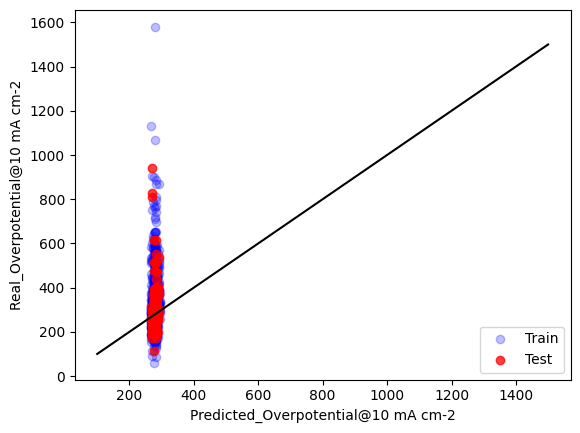

In [5]:
model_SVR = svm.SVR()
param_svr = {
#     'kernel':['linear', 'poly', 'rbf'],
#              'max_iter':[100,200,300,400,500,600,700,800,1000,1100,1200,1300,1400,1500],
#          'degree':[2,3,4],
#          'gamma':['scale','auto'],
#          'epsilon':[0.001,0.01,0.1,0.3,0.5,0.7,1],
#              'coef0':[100,200,300,400,500,600,700,800,1000,1100,1200,1300,1400,1500]
    'coef0': [100], 'degree': [2], 'epsilon': [0.3], 'gamma': ['scale'], 'kernel': ['rbf'], 'max_iter': [1000]
       }
SVR_full,SVR_full_score=gridsearch(model_SVR,param_svr,'Support Vector Regressor',X_train,y_train,X_test,y_test)

K Nearest Neighbor Regressor
Best Regressor: {'algorithm': 'ball_tree', 'leaf_size': 100, 'n_neighbors': 9, 'p': 1, 'weights': 'distance'} Best Score: -47.73501215224638
(0.5314881668672282, 45.402125952667475, 6.7381099688761, 0.9958173665158184)
(35.212177947936425, 2581.094164655875, 50.804469927909636, 0.7220734241244995)
R2 TEST 0.7220734241244995


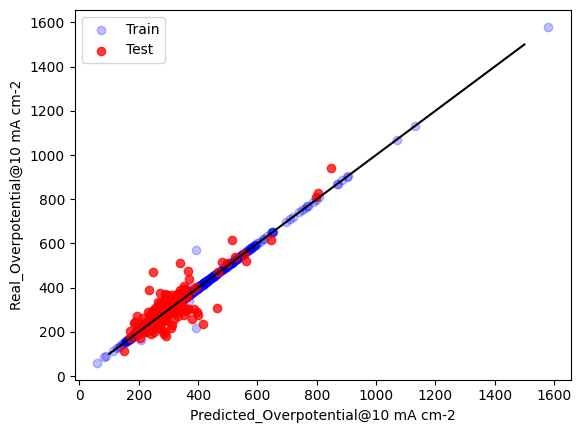

In [6]:
model_KNeighborsRegressor = neighbors.KNeighborsRegressor()
param_knr = {
#     'n_neighbors':range(1,10),'weights':['uniform','distance'],
#              'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute'],
#          'leaf_size':[2,10,20,30,40,50,100],
#          'p':range(1,10)
    'algorithm': ['ball_tree'], 'leaf_size': [100], 'n_neighbors': [9], 'p': [1], 'weights': ['distance']
       }
KNR_full,KNR_full_score=gridsearch(model_KNeighborsRegressor,param_knr,'K Nearest Neighbor Regressor',X_train,y_train,X_test,y_test)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
LightGBM
Best Regressor: {'boosting_type': 'gbdt', 'learning_rate': 0.08, 'max_depth': 7, 'n_estimators': 400, 'reg_alpha': 0.01, 'reg_lambda': 0.0001, 'subsample': 0.4} Best Score: -41.082064217147135
(17.206569485882234, 728.2267006224707, 26.985675841499148, 0.9193290543333046)
(31.40929467816608, 2052.5916868461773, 45.305537044010165, 0.8146278963422625)
R2 TEST 0.8146278963422625


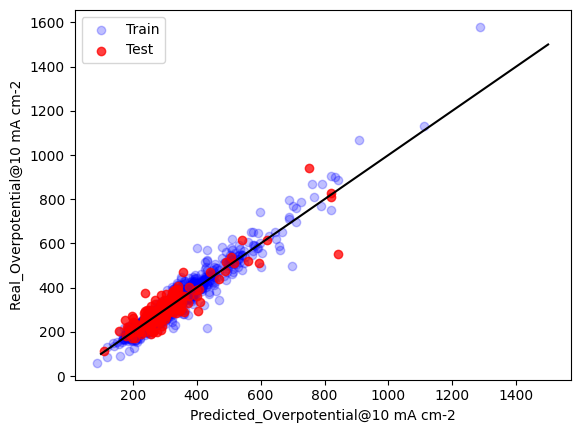

In [7]:
model_LGBMRegressor=LGBMRegressor(random_state=1,verbose=0)
param_lgbm = {
# 'boosting_type':['gbdt','rf'],
# 'learning_rate':[0.001,0.002,0.004,0.005,0.006,0.008,0.01,0.02,0.04,0.06,0.05,0.06,0.08,0.1,0.12,0.14,0.15,0.16,0.18,0.2,0.4,0.5,0.6,0.8,1],
# 'subsample':[0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1],
# 'n_estimators':[50,100,200,400],
# 'max_depth':[5,7,9,11,13,-1],
# 'reg_alpha':[0,0.001,0.01,0.0001,0.00001],
# 'reg_lambda':[0,0.001,0.01,0.0001,0.00001]
'boosting_type': ['gbdt'], 'learning_rate': [0.08], 'max_depth': [7], 'n_estimators': [400], 'reg_alpha': [0.01], 'reg_lambda': [0.0001], 'subsample': [0.4]
}
LGBM_full,LGBM_full_score=gridsearch(model_LGBMRegressor,param_lgbm,'LightGBM',X_train,y_train,X_test,y_test)

XGBoost
Best Regressor: {'booster': 'gbtree', 'learning_rate': 0.01, 'max_depth': 13, 'n_estimators': 400, 'reg_alpha': 0.0001, 'reg_lambda': 0.0001, 'subsample': 0.45} Best Score: -39.71490506097254
(14.18486139547667, 458.69663519383334, 21.417204187144346, 0.9464663160374754)
(31.932463444890203, 2070.2621818488387, 45.50013386627383, 0.7957841820234361)
R2 TEST 0.7957841820234361


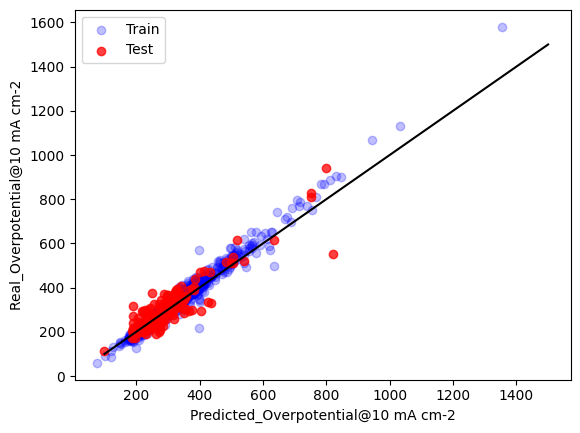

In [8]:
model_XGRegressor=XGBRegressor(random_state=1)
param_xg={
# 'booster':['gbtree'],
# 'learning_rate':[0.001,0.002,0.004,0.005,0.006,0.008,0.01,0.02,0.04,0.06,0.05,0.06,0.08,0.1,0.12,0.14,0.15,0.16,0.18,0.2,0.4,0.5,0.6,0.8,1],
# 'n_estimators':[100,200,400],
# 'max_depth':[3,7,9,11,13,-1],
# 'subsample':[0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1],
# 'reg_alpha':[0,0.001,0.01,0.0001,0.00001],
# 'reg_lambda':[0,0.001,0.01,0.0001,0.00001]
    'booster': ['gbtree'], 'learning_rate': [0.01], 'max_depth': [13], 'n_estimators': [400], 'reg_alpha': [0.0001], 'reg_lambda': [0.0001], 'subsample': [0.45]
}
XG_full,XG_full_score=gridsearch(model_XGRegressor,param_xg,'XGBoost',X_train,y_train,X_test,y_test)

CatBoost
Best Regressor: {'boosting_type': 'Plain', 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 400, 'reg_lambda': 0, 'subsample': 0.6} Best Score: -40.714060340522046
(13.384078059463803, 350.63490729574136, 18.725247856723858, 0.9636316214777254)
(30.38864770976315, 2079.540492531941, 45.6019790418348, 0.7991590281491026)
R2 TEST 0.7991590281491026


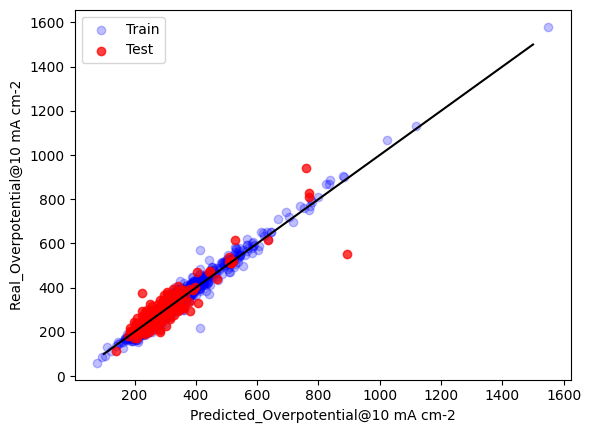

In [9]:
model_CatRegressor=catboost.CatBoostRegressor(random_state=1,verbose=0)
param_cat = {
# 'learning_rate':[0.001,0.002,0.004,0.005,0.006,0.008,0.01,0.02,0.04,0.06,0.05,0.06,0.08,0.1,0.12,0.14,0.15,0.16,0.18,0.2],
# 'n_estimators':[100,200,400],
# "boosting_type":["Plain"],
# 'max_depth':[5,7,9,11],
# 'subsample':[0.4,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1],
# 'reg_lambda':[0,0.001,0.01,0.0001,0.00001]
    'boosting_type': ['Plain'], 'learning_rate': [0.1], 'max_depth': [7], 'n_estimators': [400], 'reg_lambda': [0], 'subsample': [0.6]
}
CAT_full,CAT_full_score=gridsearch(model_CatRegressor,param_cat,'CatBoost',X_train,y_train,X_test,y_test)

D:\Anaconda\lib\site-packages\sklearn\ensemble\_gb.py:471: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and wil

D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and wi

D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and wi

D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and wi

D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and wi

D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and wi

D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and wi

D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and wi

D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and wi

GradientBoost
Best Regressor: {'criterion': 'mse', 'learning_rate': 0.1, 'loss': 'huber', 'max_depth': 7, 'max_features': 'sqrt', 'n_estimators': 400} Best Score: -39.40779959369727
(4.863298329506818, 173.5704284859786, 13.174613029838053, 0.9831233655910472)
(29.756805200033657, 1735.9918794104908, 41.665235861692786, 0.8389356585276455)
R2 TEST 0.8389356585276455


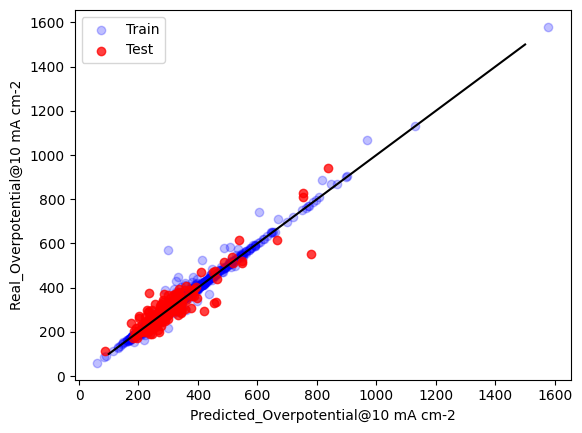

In [10]:
model_GradientBoostingRegressor = ensemble.GradientBoostingRegressor(random_state=1)
###########defining the parameters dictionary##########
param_GB = {
# 'learning_rate':[0.001,0.002,0.004,0.005,0.006,0.008,0.01,0.02,0.04,0.06,0.05,0.06,0.08,0.1,0.12,0.14,0.15,0.16,0.18,0.2,0.4,0.5,0.6,0.8,1],
# 'n_estimators':[50,100,200,400],
# 'max_depth':[3,5,7,9,11,13,16],
# 'criterion':['friedman_mse','mae','mse'],
# 'max_features':['auto','sqrt','log2'],
# 'loss':['ls', 'lad', 'huber', 'quantile']
    'criterion': ['mse'], 'learning_rate': [0.1], 'loss': ['huber'], 'max_depth': [7], 'max_features': ['sqrt'], 'n_estimators': [400]
}
GB_full,GB_full_score=gridsearch(model_GradientBoostingRegressor,param_GB,'GradientBoost',X_train,y_train,X_test,y_test)

D:\Anaconda\lib\site-packages\sklearn\ensemble\_forest.py:396: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(


Random Forest
Best Regressor: {'criterion': 'mse', 'max_depth': None, 'max_features': 'sqrt', 'n_estimators': 400} Best Score: -40.51349114201675
(15.11940287002741, 738.2399373185965, 27.170571162907056, 0.9013777443916136)
(30.263351210951207, 1632.689395763198, 40.40655139656437, 0.8098161180556286)
R2 TEST 0.8098161180556286


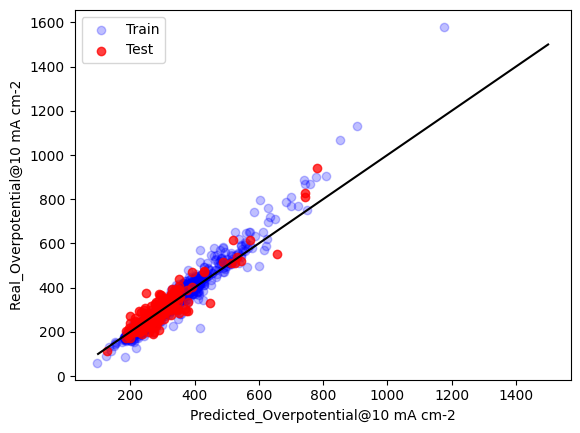

In [11]:
###########RandomForest gridsearch CV for best hyperparameter##########
model_RandomForestRegressor = ensemble.RandomForestRegressor(random_state=1)
###########defining the parameters dictionary##########
param_RF = {
# 'n_estimators':[50,100,200,400,None],
# 'max_depth':[3,5,7,9,11,None],
# 'criterion':['mse','mae'],
# 'max_features':['auto','sqrt','log2']
'criterion': ['mse'], 'max_depth':[ None], 'max_features': ['sqrt'], 'n_estimators': [400]
}
RF_full,RF_full_score=gridsearch(model_RandomForestRegressor,param_RF,'Random Forest',X_train,y_train,X_test,y_test)

D:\Anaconda\lib\site-packages\sklearn\tree\_classes.py:366: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  warnings.warn(


Decision Tree
Best Regressor: {'criterion': 'mae', 'max_depth': None, 'max_features': 'auto', 'splitter': 'random'} Best Score: -50.268093932616694
(0.5102286401925391, 45.96931407942238, 6.780067409651793, 0.9957633411682577)
(41.005405405405405, 3282.0243243243244, 57.28895464506508, 0.7189210709083018)
R2 TEST 0.7189210709083018


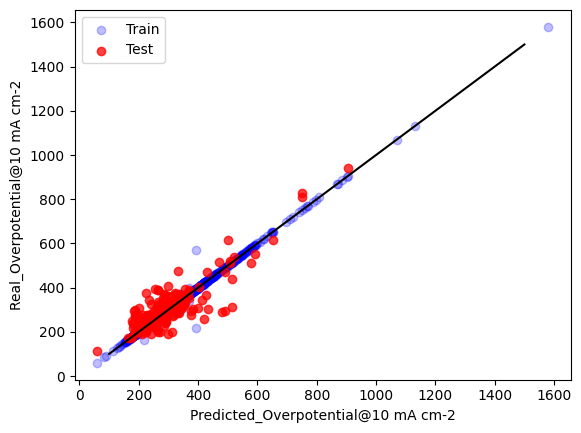

In [12]:
model_DecisionTreeRegressor = tree.DecisionTreeRegressor(random_state=1)
param_dt={
# 'max_depth':[5,6,7,8,9,10,11,None],
# 'max_features':['auto','sqrt','log2'],
# 'criterion' : ["mse", "friedman_mse", "mae"],
# 'splitter' : [ "best",'random']
'criterion': ['mae'], 'max_depth': [None], 'max_features': ['auto'], 'splitter': ['random']
}
DT_full,DT_full_score=gridsearch(model_DecisionTreeRegressor,param_dt,'Decision Tree',X_train,y_train,X_test,y_test)

AdaBoost
Best Regressor: {'learning_rate': 0.001, 'loss': 'exponential', 'n_estimators': 200} Best Score: -57.0480759459626
(54.875468815375115, 6944.584138357379, 83.33417149259587, -2.315881044921109)
(51.76515380688529, 5744.267631825364, 75.79094689885702, -1.468582022021688)
R2 TEST -1.468582022021688


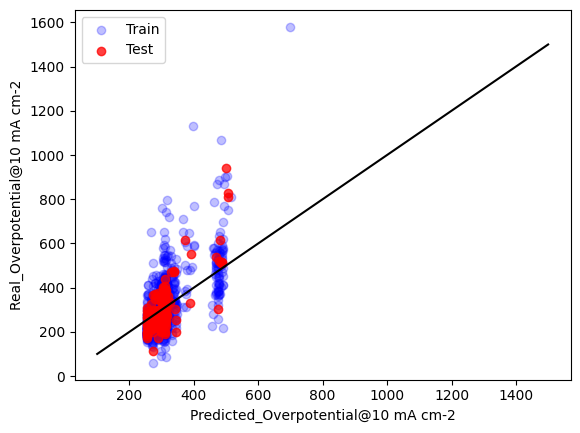

In [13]:
model_AdaBoostRegressor = ensemble.AdaBoostRegressor(random_state=1)
param_ada={
# 'n_estimators':[50,100,200,400,800],
# 'learning_rate':[0.001,0.002,0.004,0.005,0.006,0.008,0.01,0.02,0.04,0.06,0.05,0.06,0.08,0.1,0.12,0.14,0.15,0.16,0.18,0.2,0.4,0.5,0.6,0.8,1],
# 'loss':['linear', 'square', 'exponential']  
'learning_rate': [0.001], 'loss': ['exponential'], 'n_estimators': [200]
}
ADA_full,ADA_full_score=gridsearch(model_AdaBoostRegressor,param_ada,'AdaBoost',X_train,y_train,X_test,y_test)

In [48]:
def create_ANN_model_1layer(X,learning_rate,regular_term=0.001,neuron_number=50,drop_out_rate=0):
    regularizer=keras.regularizers.l2(regular_term)
    model = Sequential() 
    model.add(Dense(neuron_number, input_dim=X.shape[1], kernel_initializer='random_normal',
                    bias_initializer='random_normal',activation='relu',kernel_regularizer=regularizer)) 
    model.add(Dropout(drop_out_rate))
    model.add(Dense(neuron_number, input_dim=neuron_number, kernel_initializer='random_normal',
                    bias_initializer='random_normal',activation='relu',kernel_regularizer=regularizer)) 
    model.add(Dropout(drop_out_rate))
    model.add(Dense(1, input_dim=neuron_number, activation='linear'))
    adam=optimizers.Adam(learning_rate)
    model.compile(loss='mae')
    return model
def create_ANN_model_2layer(X,learning_rate,regular_term=0.001,neuron_number=50,drop_out_rate=0):
    regularizer=keras.regularizers.l2(regular_term)
    model = Sequential() 
    model.add(Dense(neuron_number, input_dim=X.shape[1], kernel_initializer='random_normal',
                    bias_initializer='random_normal',activation='relu',kernel_regularizer=regularizer)) 
    model.add(Dropout(drop_out_rate))
    model.add(Dense(neuron_number, input_dim=neuron_number, kernel_initializer='random_normal',
                    bias_initializer='random_normal',activation='relu',kernel_regularizer=regularizer)) 
    model.add(Dropout(drop_out_rate))
    model.add(Dense(neuron_number, input_dim=neuron_number, kernel_initializer='random_normal',
                    bias_initializer='random_normal',activation='relu',kernel_regularizer=regularizer)) 
    model.add(Dropout(drop_out_rate))
    model.add(Dense(1, input_dim=neuron_number, activation='linear'))
    adam=optimizers.Adam(learning_rate)
    model.compile(loss='mae')
    return model

In [49]:
model_ANNRegressor1= KerasRegressor(build_fn=create_ANN_model_1layer(X=data_input_full,learning_rate=0.01), verbose=0)
model_ANNRegressor2= KerasRegressor(build_fn=create_ANN_model_2layer(X=data_input_full,learning_rate=0.01), verbose=0)

In [50]:
epochs_list=[]
for i in range(10,210,10):
    epochs_list.append(i)

In [51]:
# 设置参数候选值
batch_size_list = [8,16,32]
optimizers_list=['sgd', 'rmsprop', 'adam', 'adagrad']
param_ann = dict(batch_size=batch_size_list, 
                 epochs=epochs_list,
                optimizer=optimizers_list
                )

In [52]:
param_ann_1={'batch_size': [8], 'epochs': [180], 'optimizer': ['rmsprop']}
param_ann_2={'batch_size': [8], 'epochs': [70], 'optimizer': ['rmsprop']}

INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmpy0fpgmn7\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmpr5j4jx_s\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmp_rc9qgdr\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmpqz9rfogp\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmpyu4xcif4\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmppdiuumm4\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmpo0yjzar_\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmpaxx4yooe\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmpmrkncxl3\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmpdhtjb3oc\assets
INFO:tensorflow:Assets written to: C:\Us

``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.


Artificial Neural Network
Best Regressor: {'batch_size': 8, 'epochs': 180, 'optimizer': 'rmsprop'} Best Score: -57.49376833801292
(44.213057848520656, 7235.597520169384, 85.06231551144951, -0.918120443464572)
(46.91260697648332, 4480.263330056427, 66.93476921642763, 0.12635008794769342)
R2 TEST 0.12635008794769342


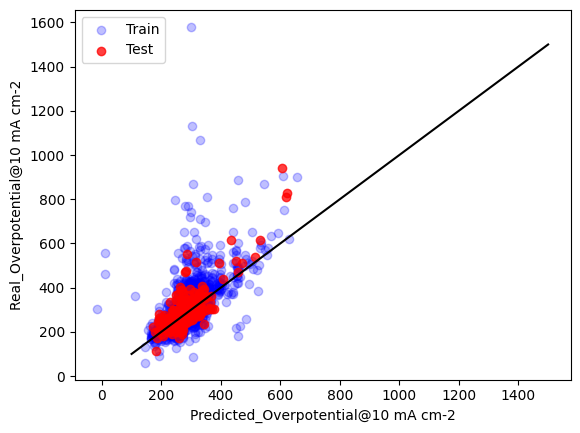

In [54]:
ANN_1layer,ANN_1layer_score=gridsearch(model_ANNRegressor1,param_ann_1,'Artificial Neural Network',X_train,y_train,X_test,y_test)

INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmpjueqowcb\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmp4y0_92bl\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmprv2g3_9r\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmpkid_n1o5\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmpznywb0x1\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmphp8p6krm\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmpkh_138mu\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmpala423h1\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmpd4drpg8_\assets
INFO:tensorflow:Assets written to: C:\Users\Administrator\AppData\Local\Temp\tmp47a04i9n\assets
INFO:tensorflow:Assets written to: C:\Us

``build_fn`` will be renamed to ``model`` in a future release, at which point use of ``build_fn`` will raise an Error instead.


Artificial Neural Network
Best Regressor: {'batch_size': 8, 'epochs': 70, 'optimizer': 'rmsprop'} Best Score: -60.74636514398255
(53.65813617729251, 9146.388045474485, 95.63675049621084, -1.1062261383701104)
(53.3864953943201, 6576.428469211226, 81.09518154126808, -0.7344182366156811)
R2 TEST -0.7344182366156811


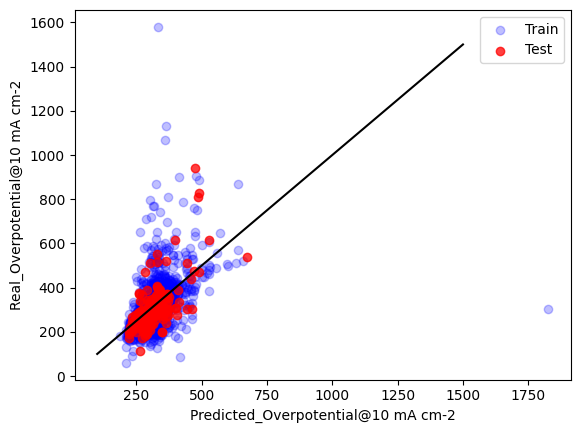

In [55]:
ANN_2layer,ANN_2layer_score=gridsearch(model_ANNRegressor2,param_ann_2,'Artificial Neural Network',X_train,y_train,X_test,y_test)

In [14]:
import shap
ELE=data_input_full.iloc[:,0:36]
SYN=data_input_full.iloc[:,36:]

100%|===================| 1845/1847 [00:30<00:00]        

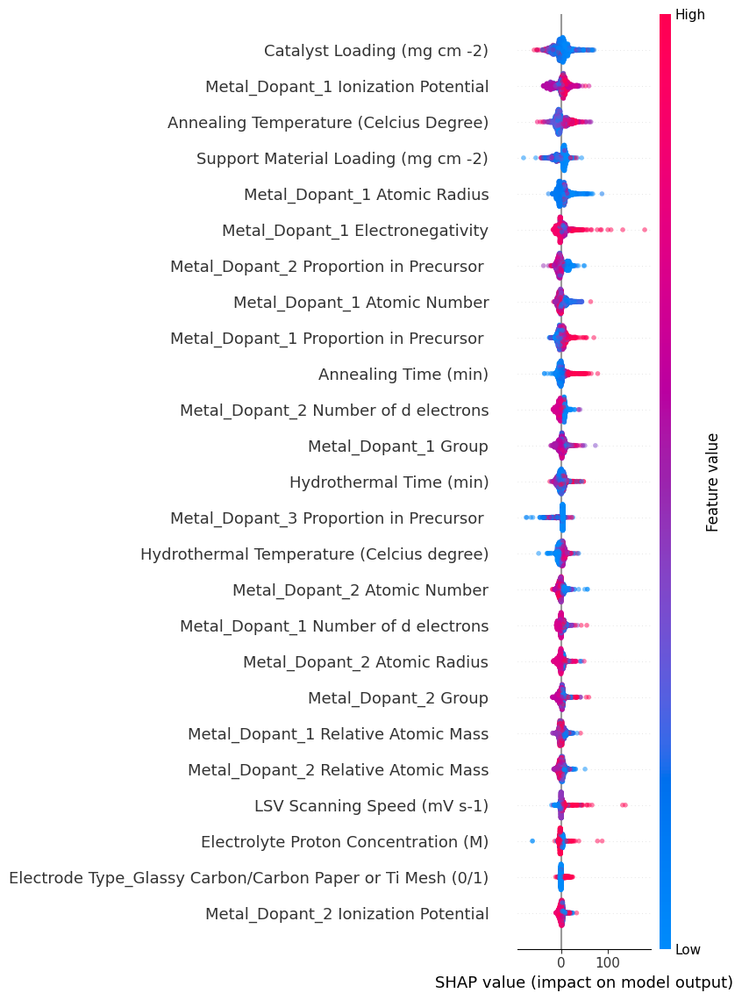

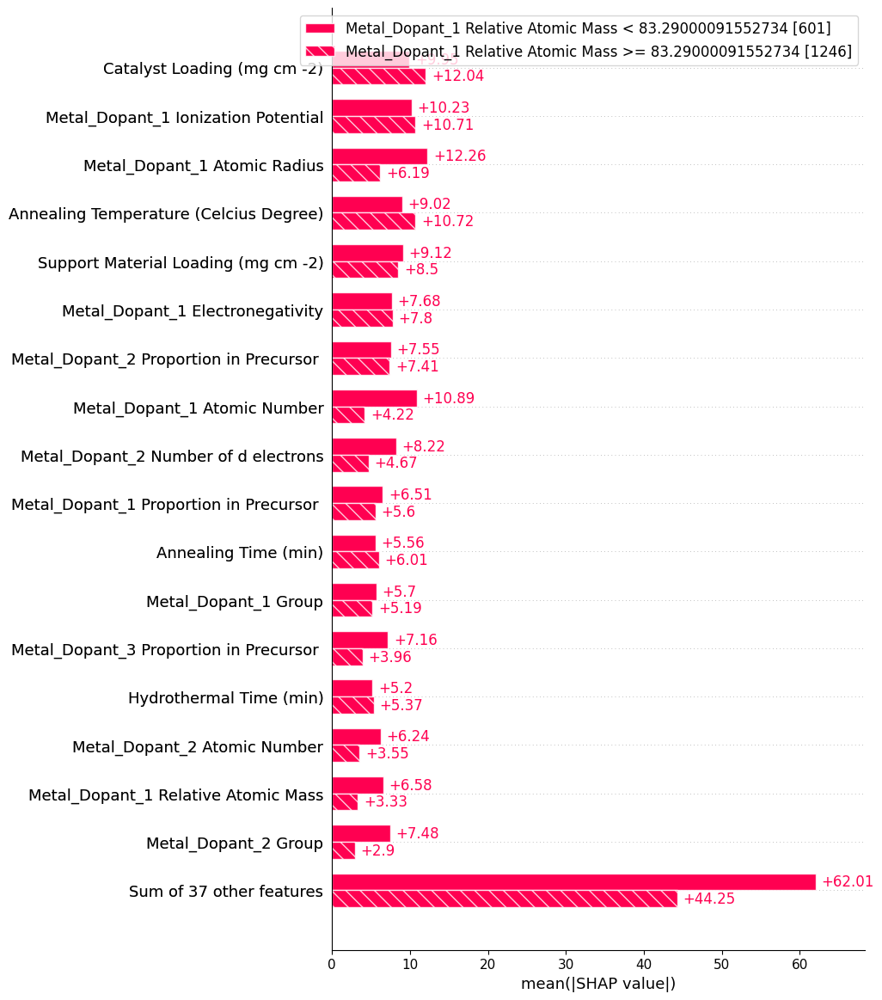

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
55it [01:08,  1.53s/it]                                                                                                


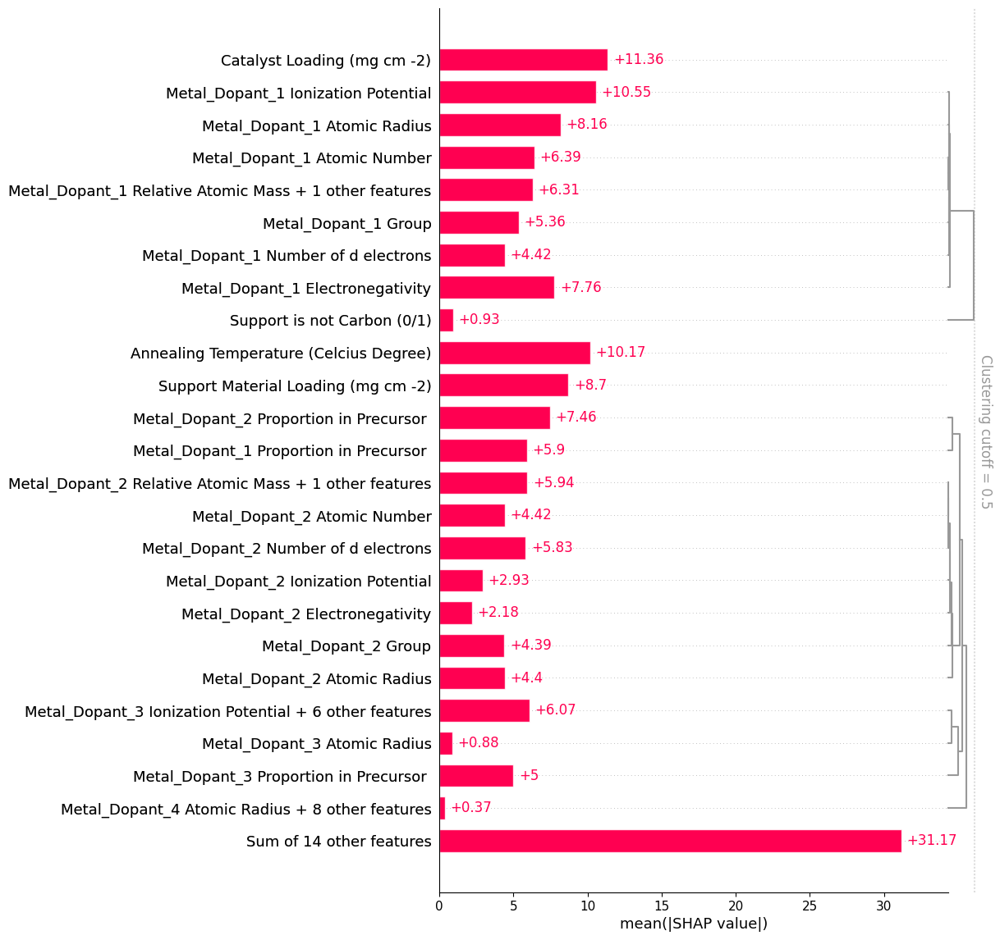

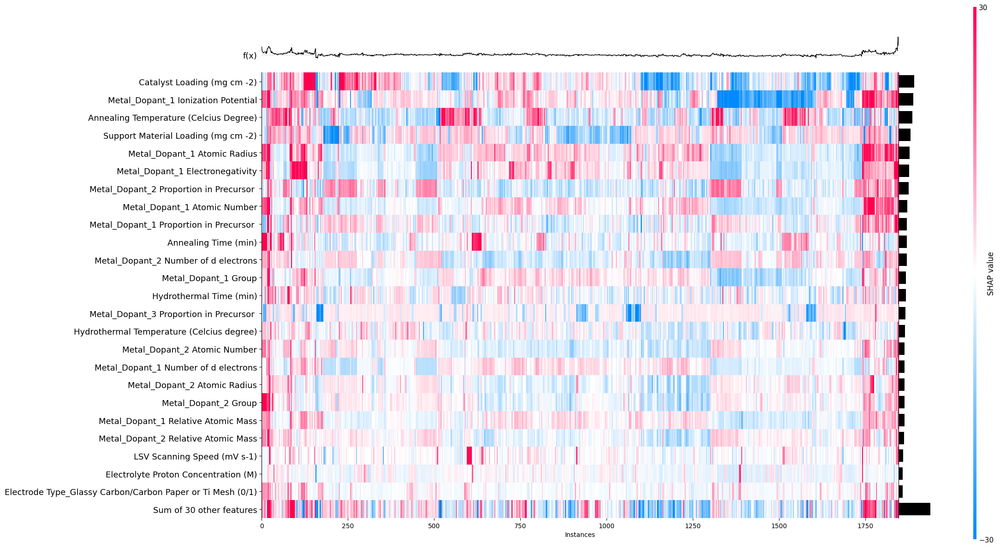

In [15]:
###############################################################################################################################
######################################################Gradient Boost###########################################################
###############################################################################################################################

################################
#############overall############
################################
explainer = shap.TreeExplainer(GB_full, data_input_full)
shap_values_GB = explainer(data_input_full,check_additivity=False)
#####summary plot#####
shap.summary_plot(shap_values_GB,feature_names=list(data_input_full.columns),max_display=25,alpha=0.5)
#####cohorts plot#####
GB_v = shap_values_GB.cohorts(2).abs.mean(0)
shap.plots.bar(GB_v,max_display=18)
#####clustered plot#####
clustering = shap.utils.hclust(data_input_full, data_output_full) 
shap.plots.bar(shap_values_GB, max_display=25,clustering=clustering,clustering_cutoff=0.5)
#####heat map#####
shap.plots.heatmap(shap_values_GB,max_display=25,plot_width=20)

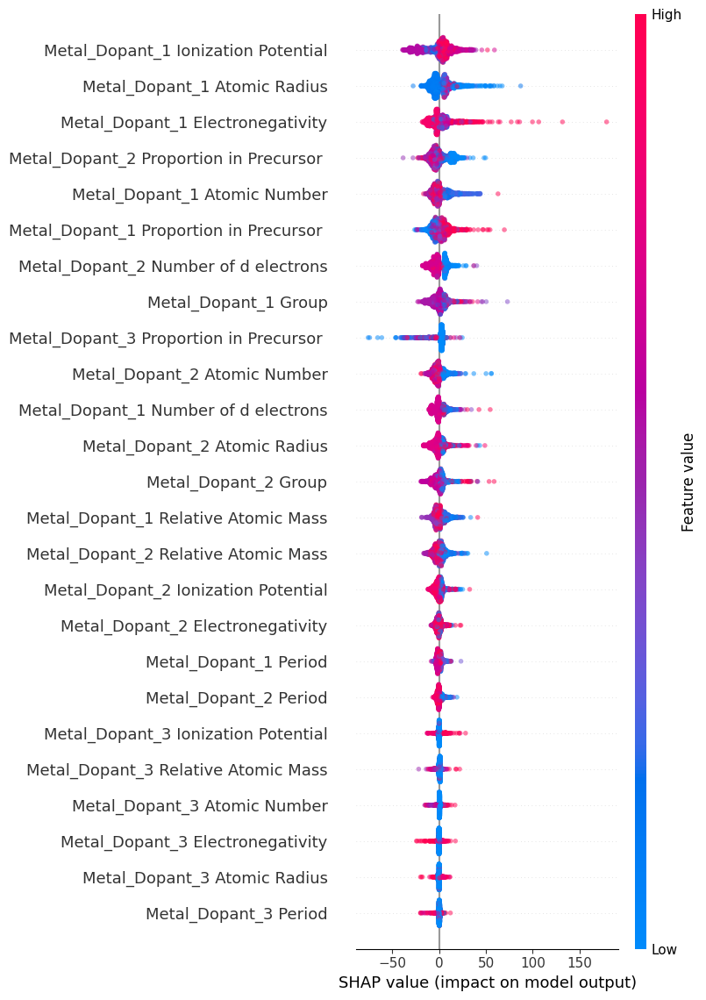

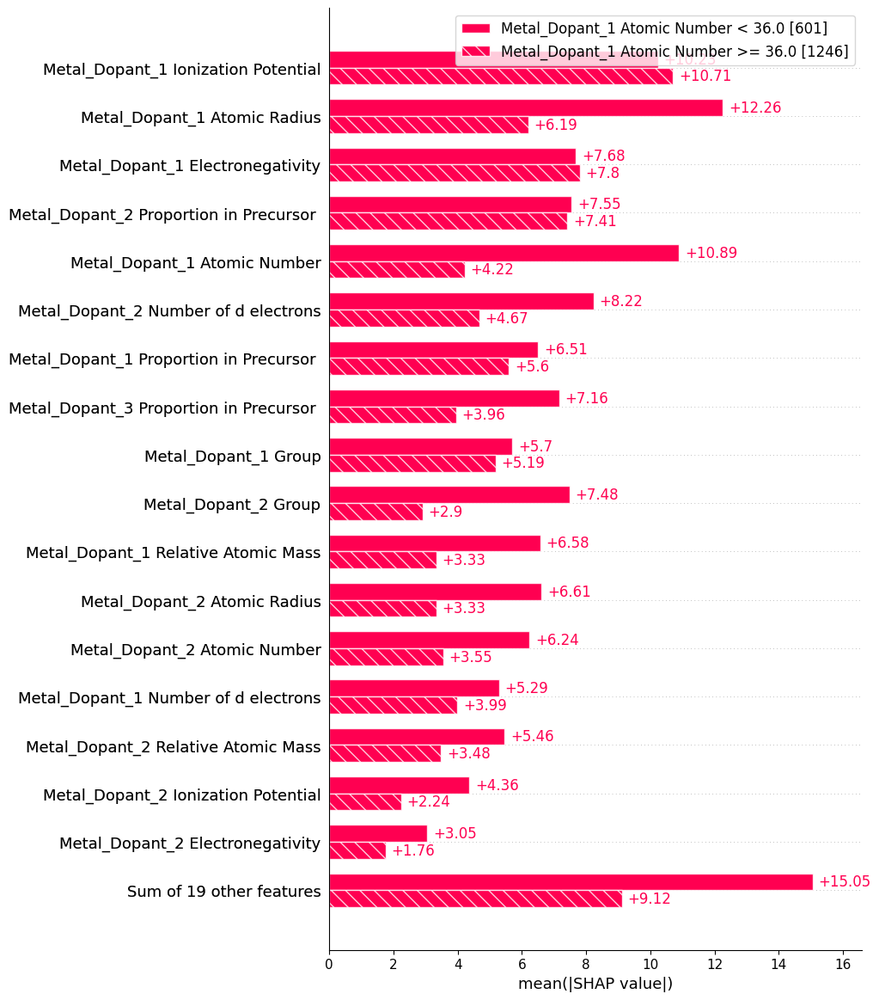

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
37it [00:45,  1.84s/it]                                                                                                


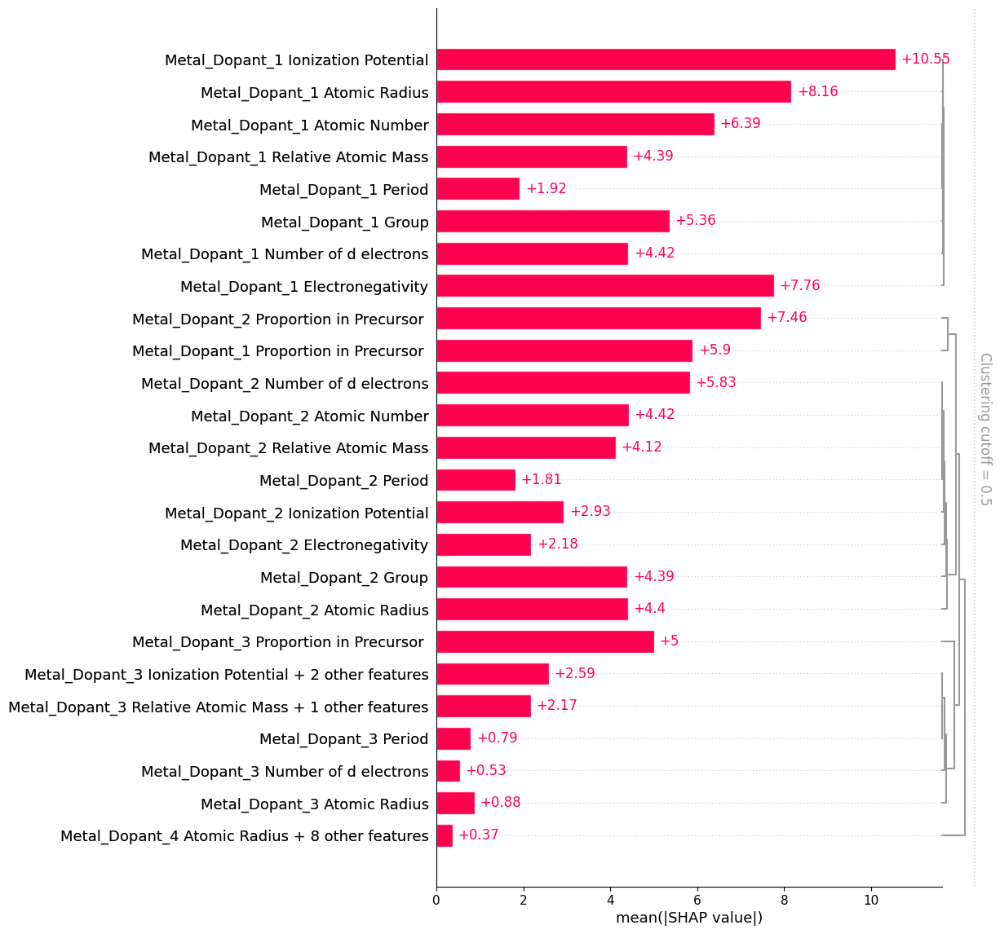

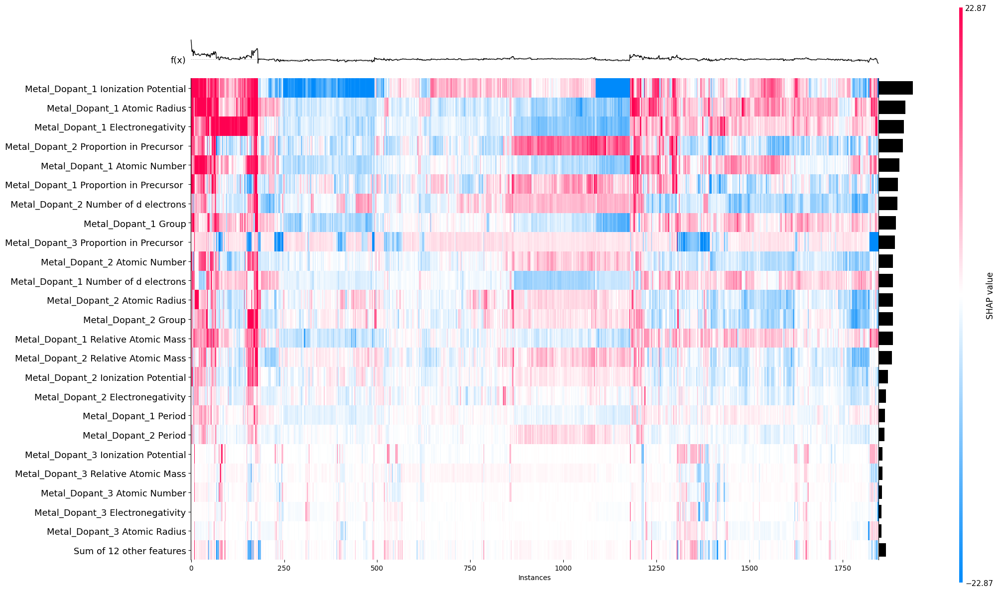

In [16]:
###############################################################################################################################
######################################################Gradient Boost###########################################################
###############################################################################################################################

################################
#############ELEMENT############
################################
shap_values_GB_ELE = shap_values_GB[:,0:36]
#####summary plot#####
shap.summary_plot(shap_values_GB_ELE,feature_names=list(ELE.columns),max_display=25,alpha=0.5)
#####cohorts plot#####
GB_v = shap_values_GB_ELE.cohorts(2).abs.mean(0)
shap.plots.bar(GB_v,max_display=18)
#####clustered plot#####
clustering = shap.utils.hclust(ELE, data_output_full) 
shap.plots.bar(shap_values_GB_ELE, max_display=25,clustering=clustering,clustering_cutoff=0.5)
#####heat map#####
shap.plots.heatmap(shap_values_GB_ELE,max_display=25,plot_width=20)

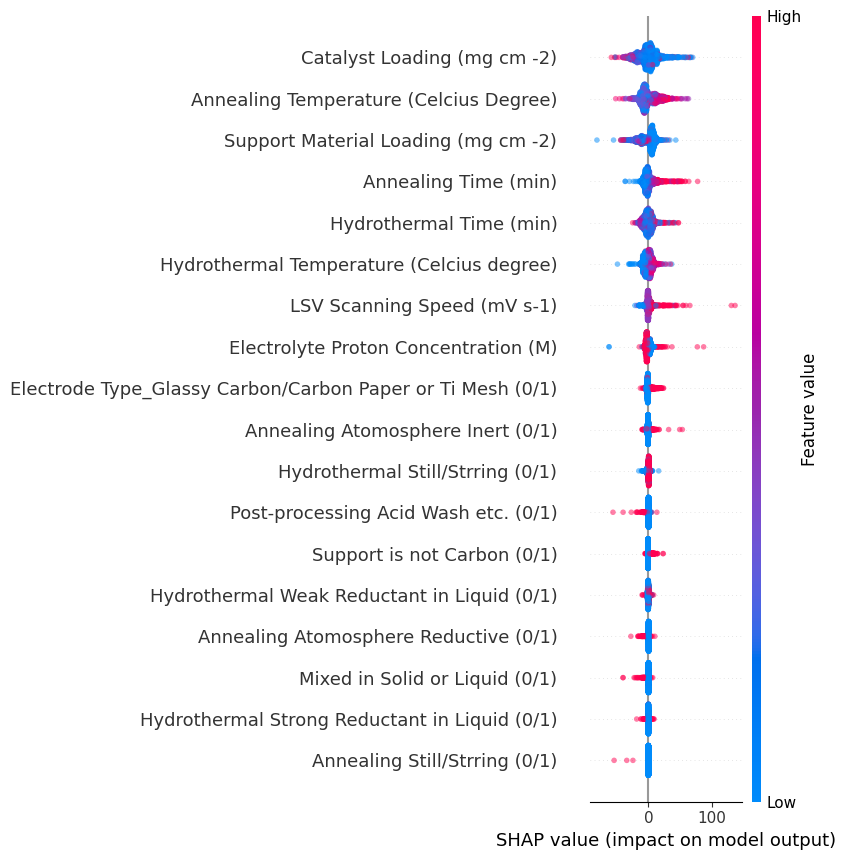

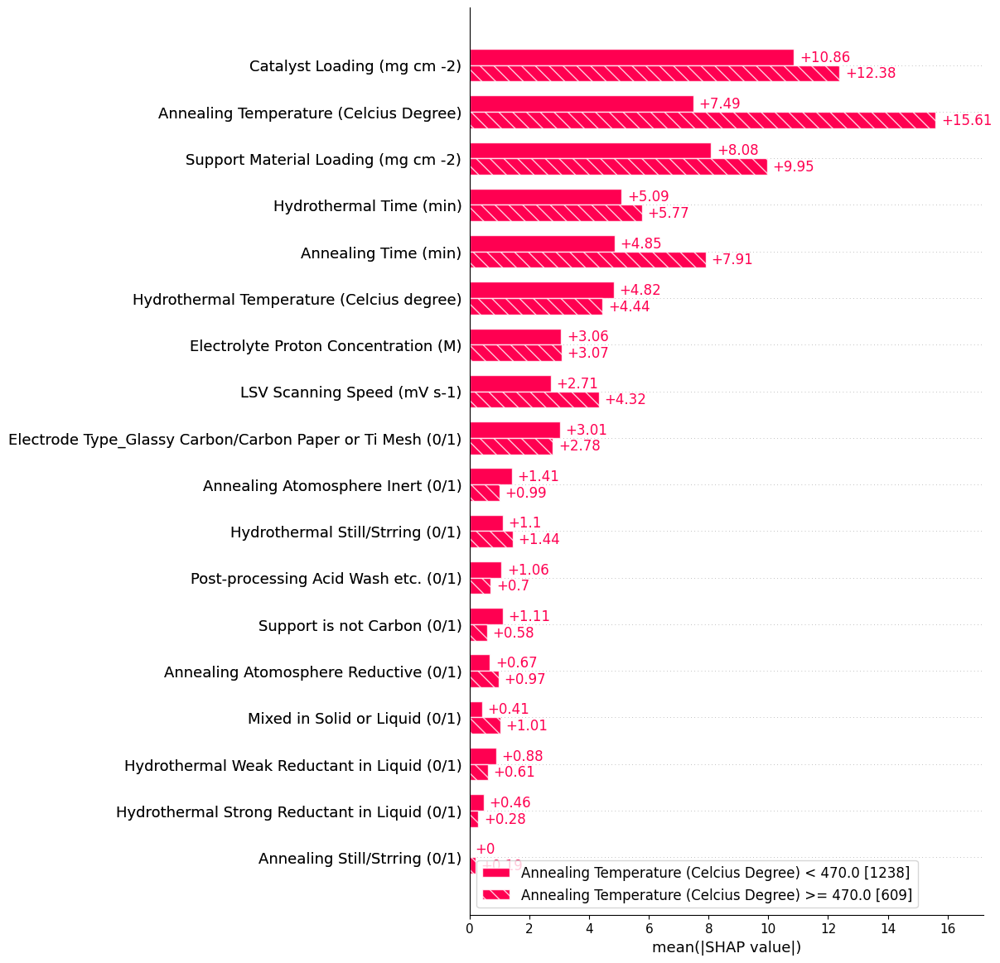

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


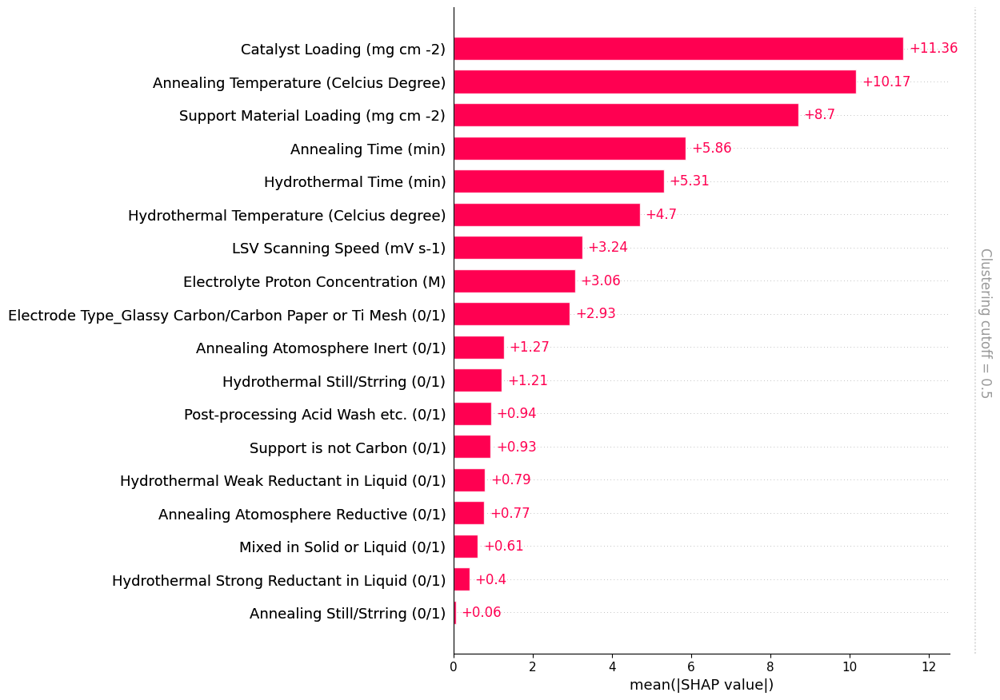

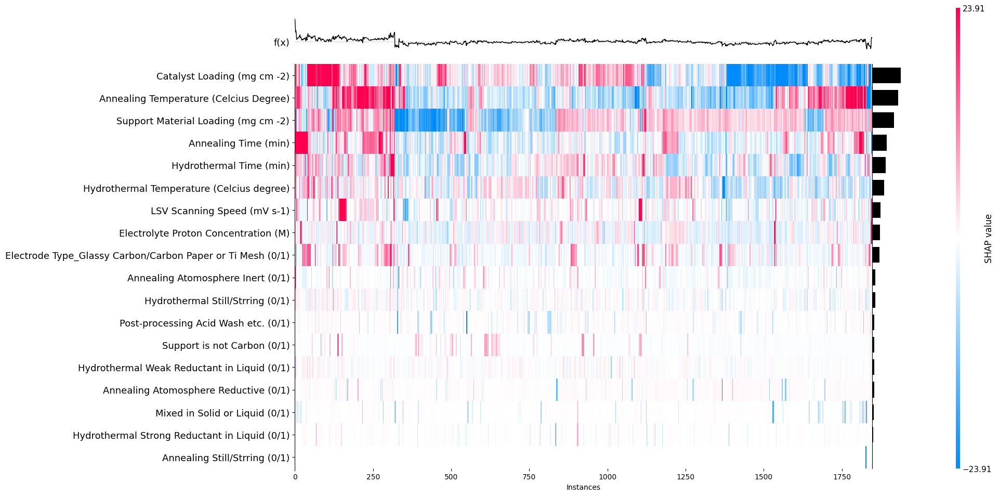

In [17]:
###############################################################################################################################
######################################################Gradient Boost###########################################################
###############################################################################################################################

################################
############SYNTHESIS###########
################################
shap_values_GB_SYN = shap_values_GB[:,36:]
#####summary plot#####
shap.summary_plot(shap_values_GB_SYN,feature_names=list(SYN.columns),max_display=25,alpha=0.5)
#####cohorts plot#####
GB_v = shap_values_GB_SYN.cohorts(2).abs.mean(0)
shap.plots.bar(GB_v,max_display=18)
#####clustered plot#####
clustering = shap.utils.hclust(SYN, data_output_full) 
shap.plots.bar(shap_values_GB_SYN, max_display=25,clustering=clustering,clustering_cutoff=0.5)
#####heat map#####
shap.plots.heatmap(shap_values_GB_SYN,max_display=25,plot_width=20)

 95%|=================== | 1758/1847 [00:18<00:00]       

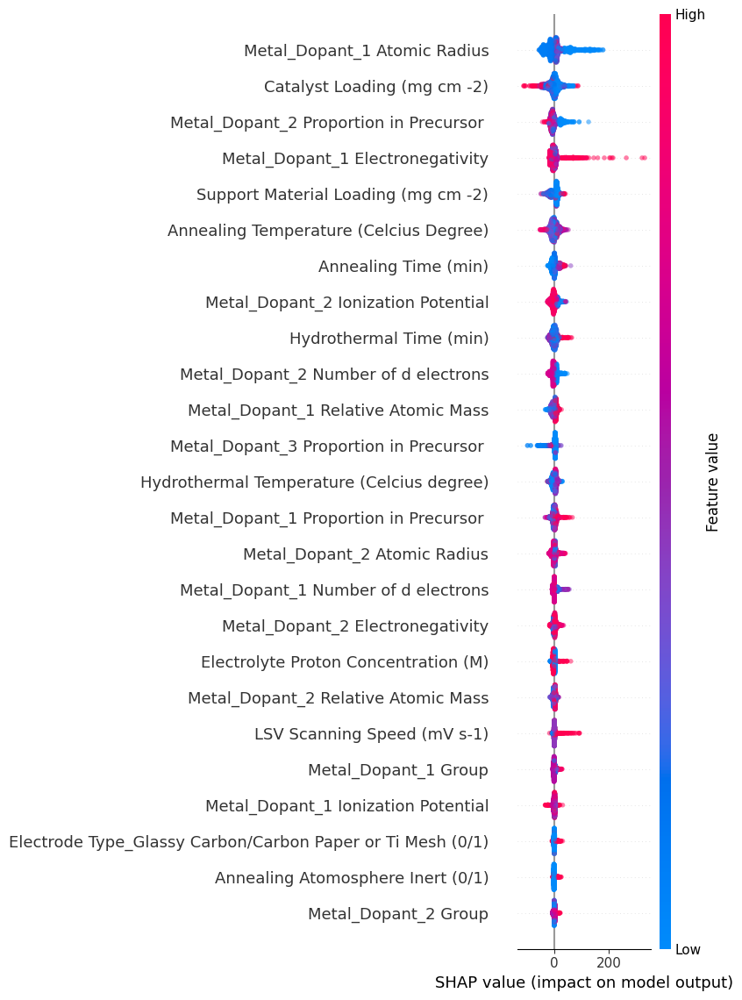

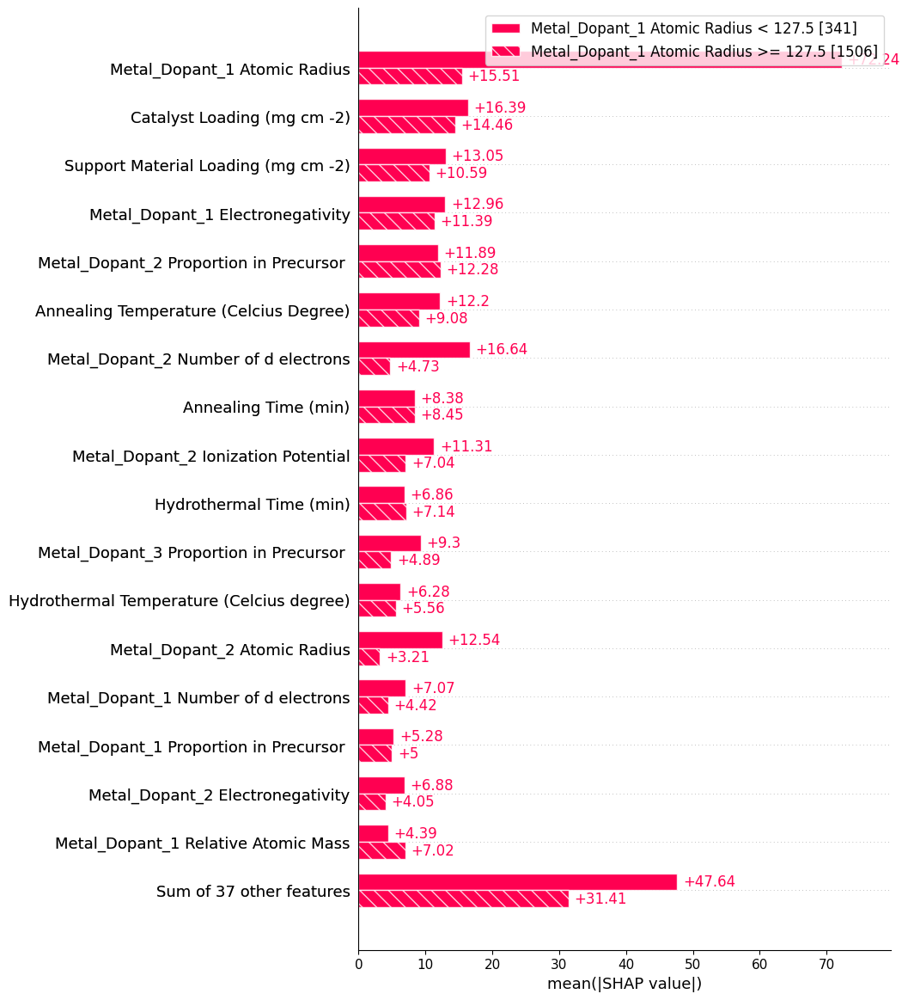

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
55it [01:08,  1.52s/it]                                                                                                


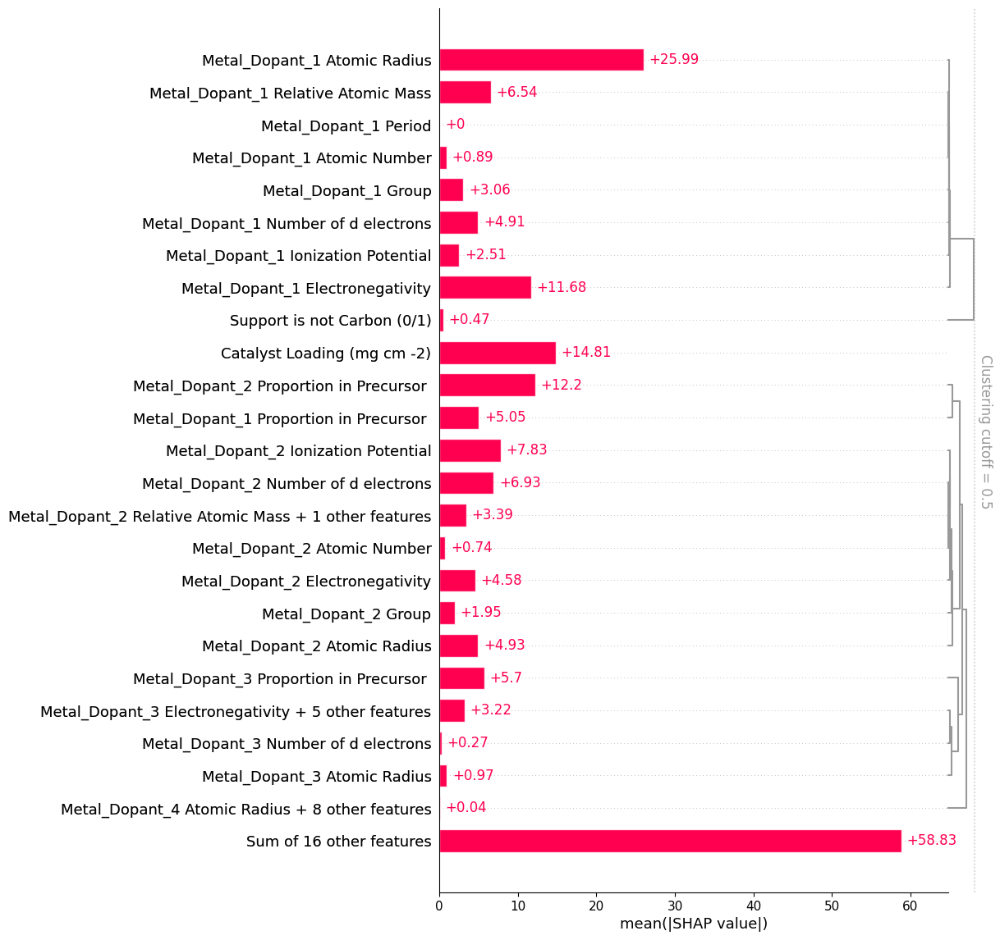

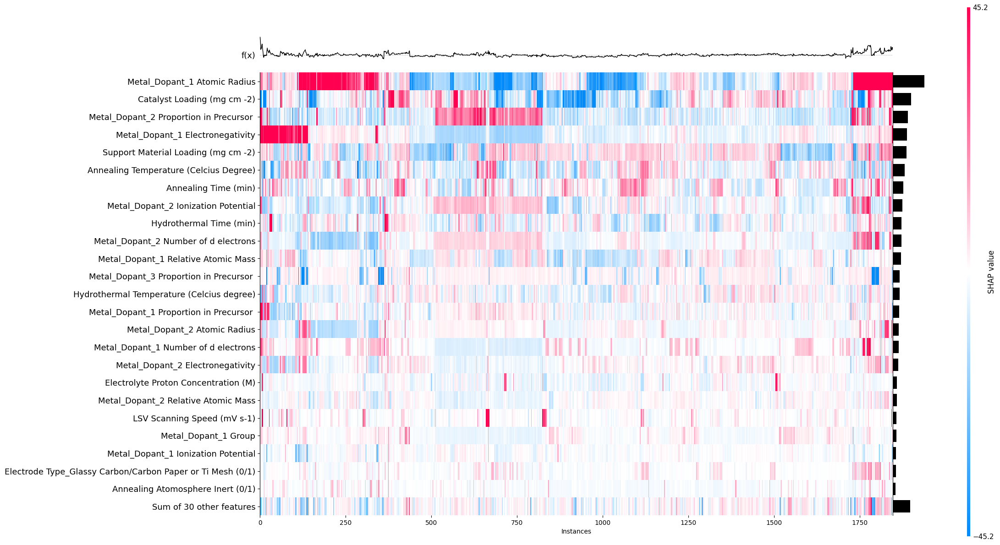

In [18]:
###############################################################################################################################
###########################################################LGBM################################################################
###############################################################################################################################

################################
#############overall############
################################
explainer = shap.TreeExplainer(LGBM_full, data_input_full)
shap_values_LGBM = explainer(data_input_full,check_additivity=False)
#####summary plot#####
shap.summary_plot(shap_values_LGBM,feature_names=list(data_input_full.columns),max_display=25,alpha=0.5)
#####cohorts plot#####
LGBM_v = shap_values_LGBM.cohorts(2).abs.mean(0)
shap.plots.bar(LGBM_v,max_display=18)
#####clustered plot#####
clustering = shap.utils.hclust(data_input_full, data_output_full) 
shap.plots.bar(shap_values_LGBM, max_display=25,clustering=clustering,clustering_cutoff=0.5)
#####heat map#####
shap.plots.heatmap(shap_values_LGBM,max_display=25,plot_width=20)

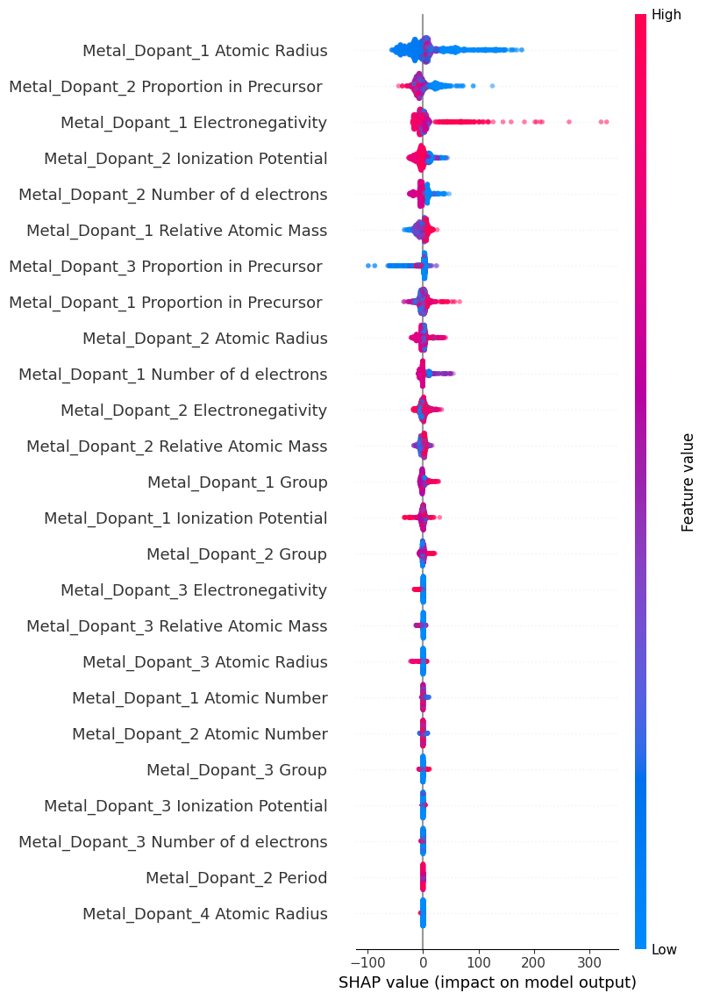

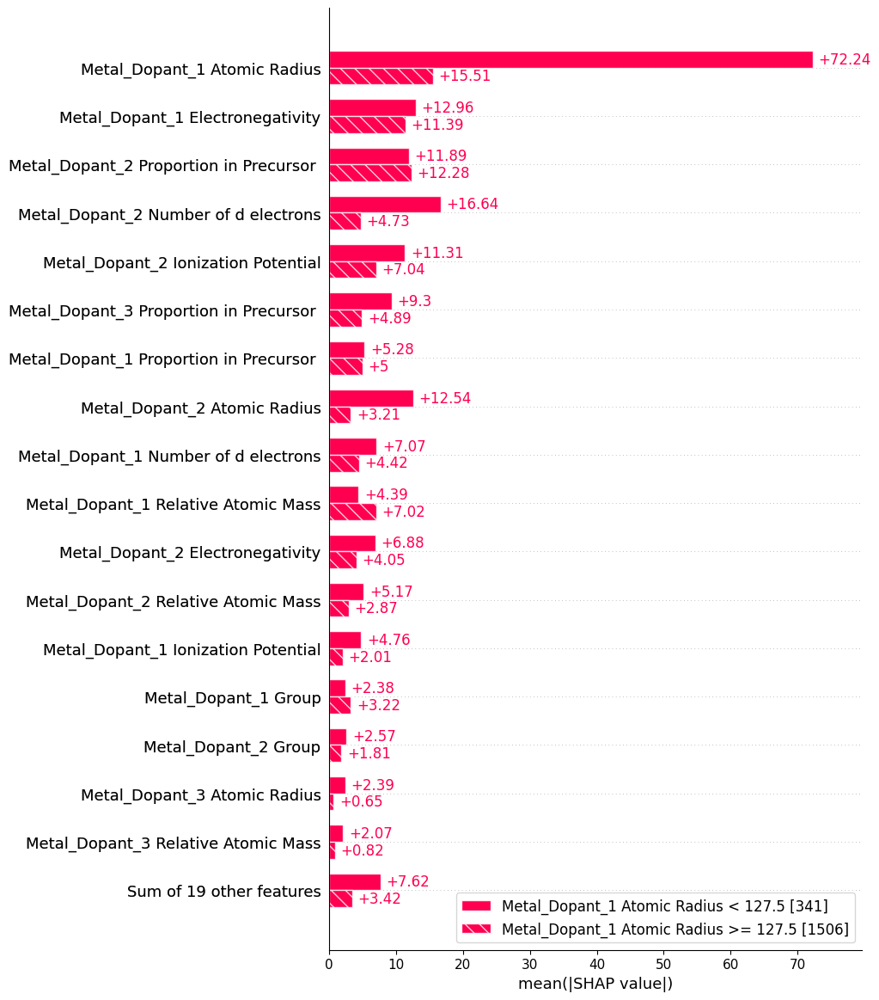

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
37it [00:47,  1.78s/it]                                                                                                


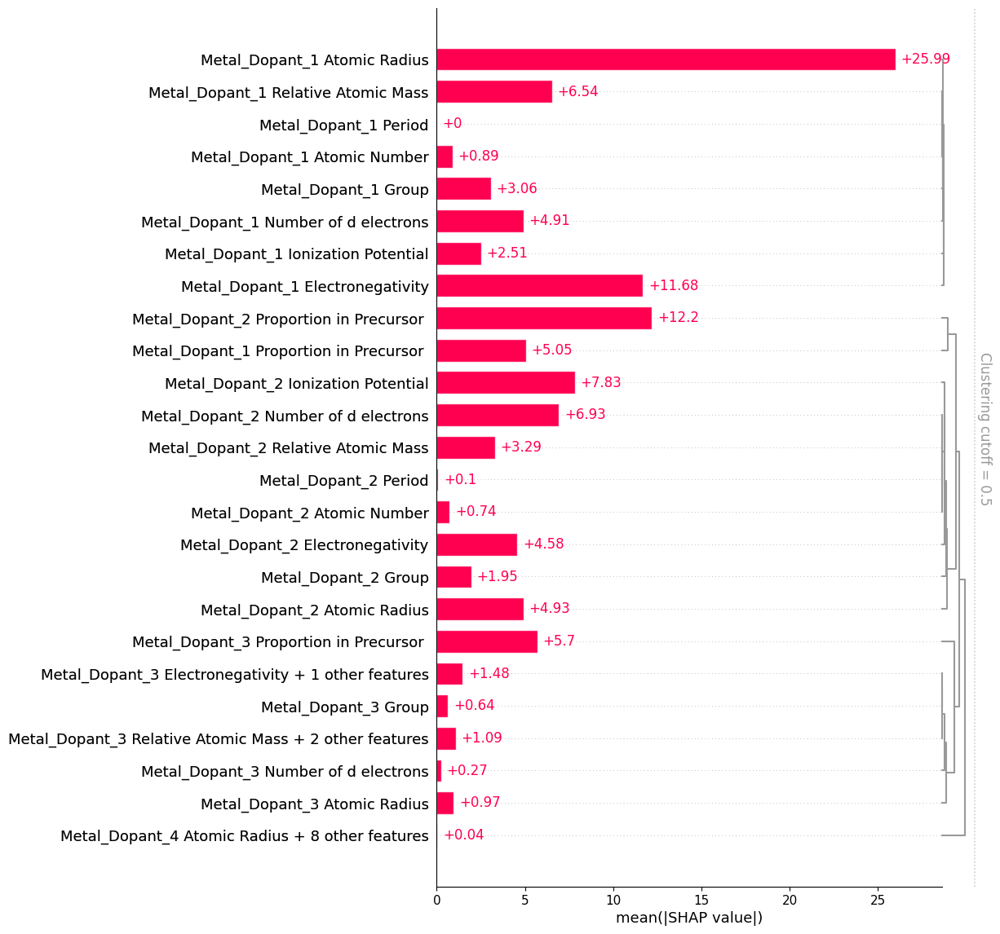

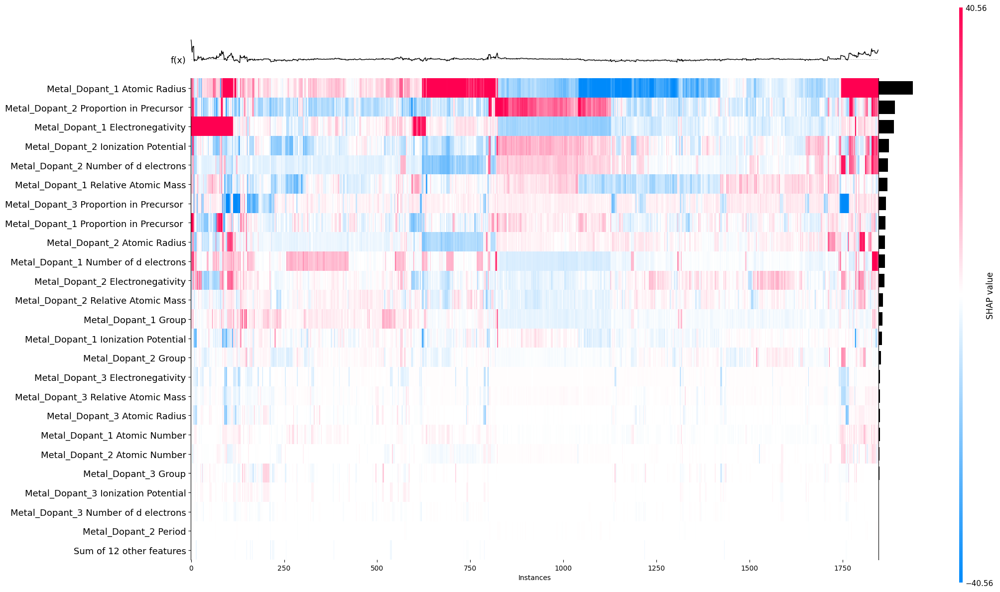

In [19]:
###############################################################################################################################
###########################################################LGBM################################################################
###############################################################################################################################

################################
#############ELEMENT############
################################
shap_values_LGBM_ELE = shap_values_LGBM[:,0:36]
#####summary plot#####
shap.summary_plot(shap_values_LGBM_ELE,feature_names=list(ELE.columns),max_display=25,alpha=0.5)
#####cohorts plot#####
LGBM_v = shap_values_LGBM_ELE.cohorts(2).abs.mean(0)
shap.plots.bar(LGBM_v,max_display=18)
#####clustered plot#####
clustering = shap.utils.hclust(ELE, data_output_full) 
shap.plots.bar(shap_values_LGBM_ELE, max_display=25,clustering=clustering,clustering_cutoff=0.5)
#####heat map#####
shap.plots.heatmap(shap_values_LGBM_ELE,max_display=25,plot_width=20)

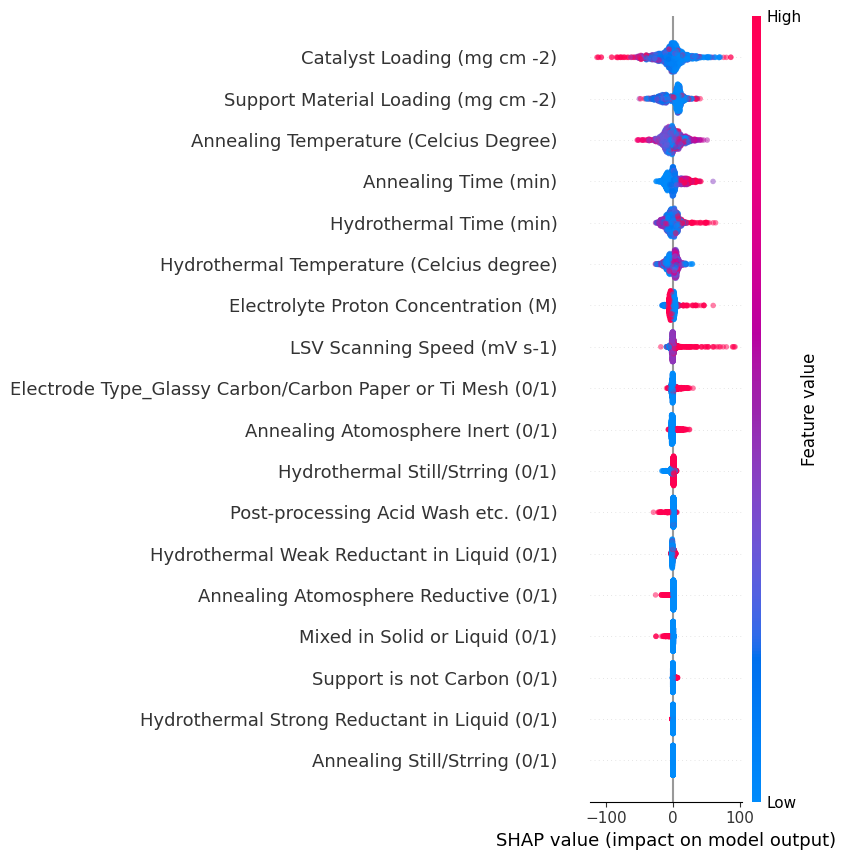

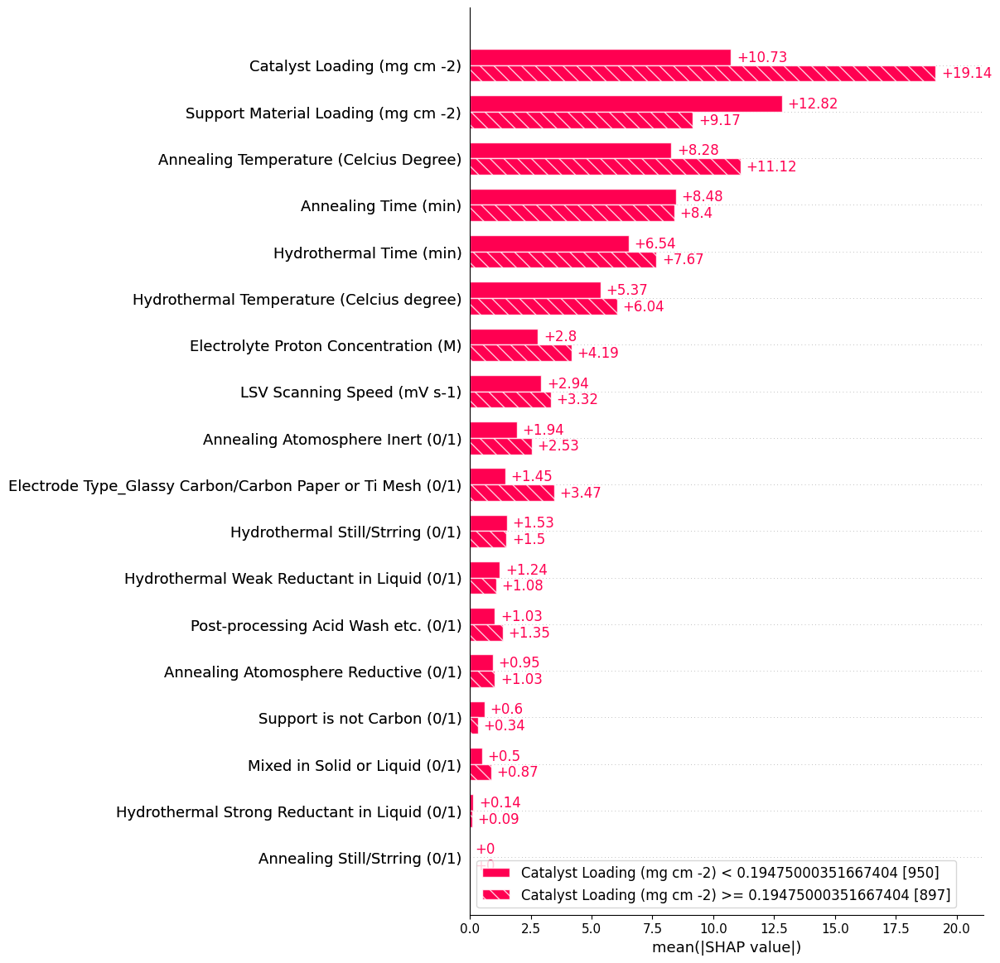

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


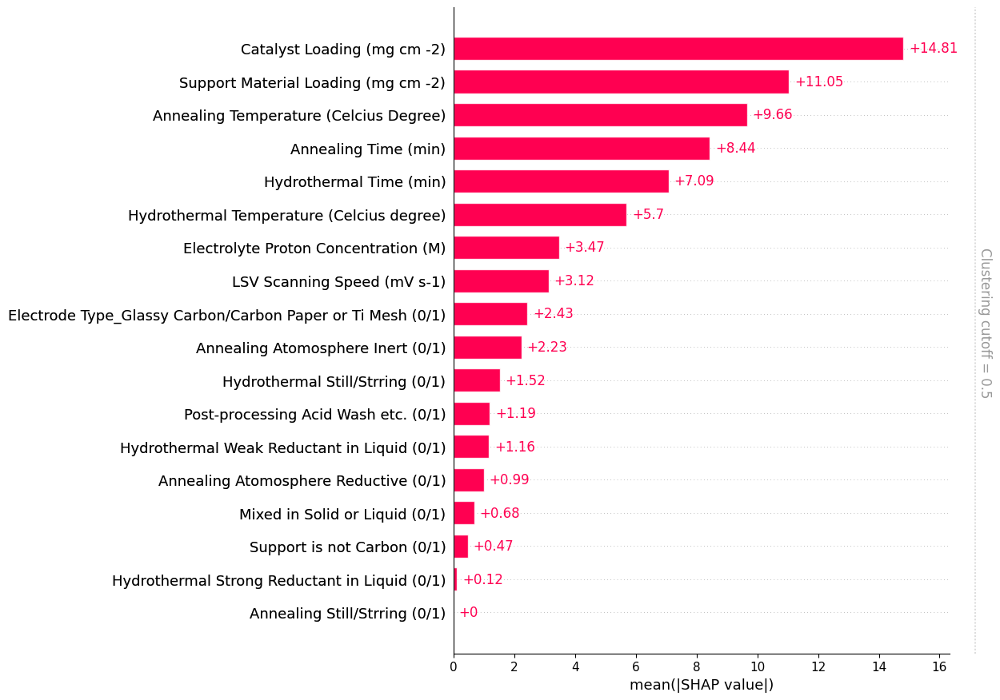

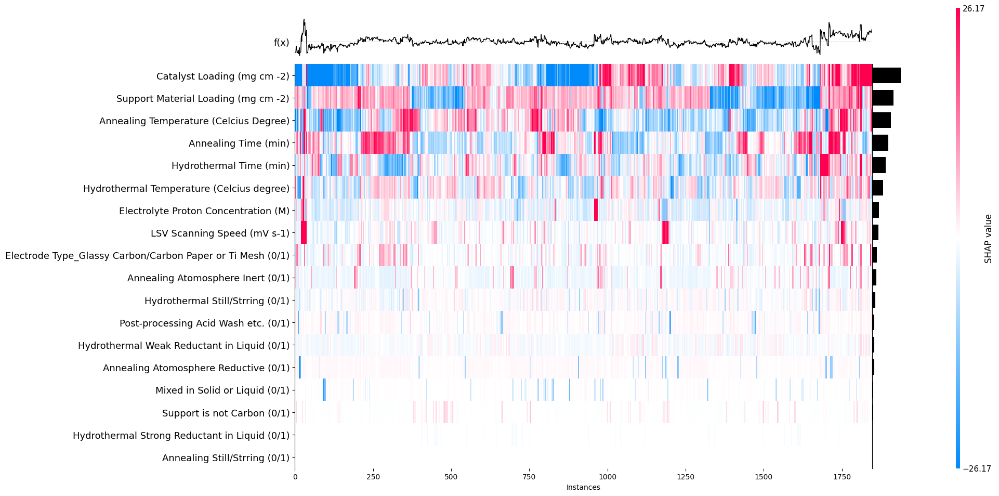

In [20]:
###############################################################################################################################
###########################################################LGBM################################################################
###############################################################################################################################

################################
#############SYNTHESIS##########
################################
shap_values_LGBM_SYN = shap_values_LGBM[:,36:]
#####summary plot#####
shap.summary_plot(shap_values_LGBM_SYN,feature_names=list(SYN.columns),max_display=25,alpha=0.5)
#####cohorts plot#####
LGBM_v = shap_values_LGBM_SYN.cohorts(2).abs.mean(0)
shap.plots.bar(LGBM_v,max_display=18)
#####clustered plot#####
clustering = shap.utils.hclust(SYN, data_output_full) 
shap.plots.bar(shap_values_LGBM_SYN, max_display=25,clustering=clustering,clustering_cutoff=0.5)
#####heat map#####
shap.plots.heatmap(shap_values_LGBM_SYN,max_display=25,plot_width=20)

100%|===================| 1842/1847 [04:08<00:00]        

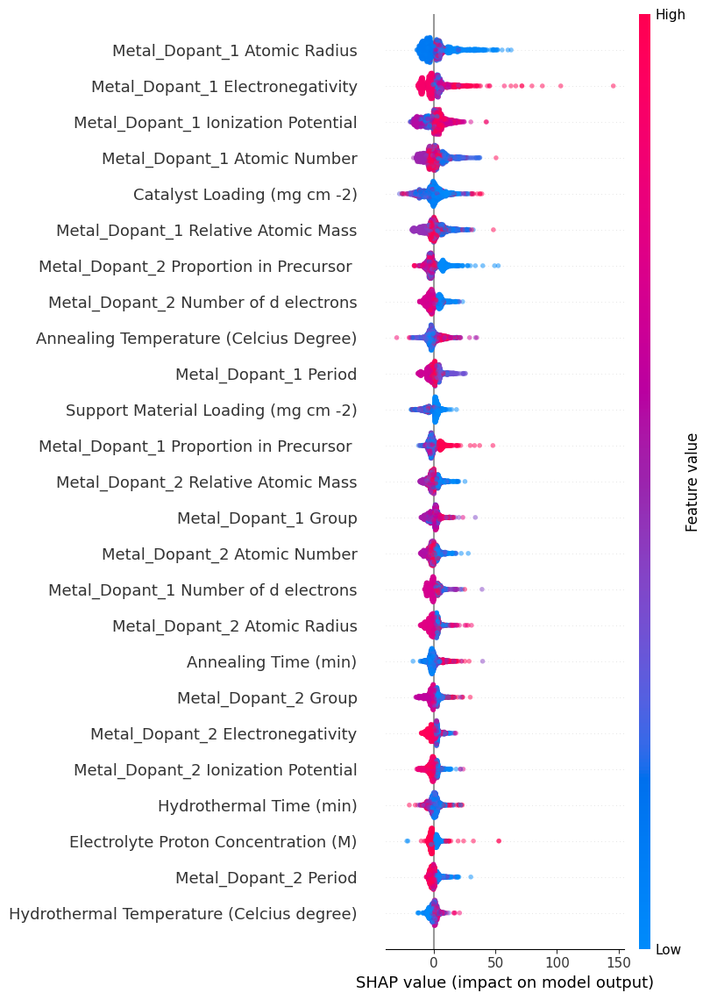

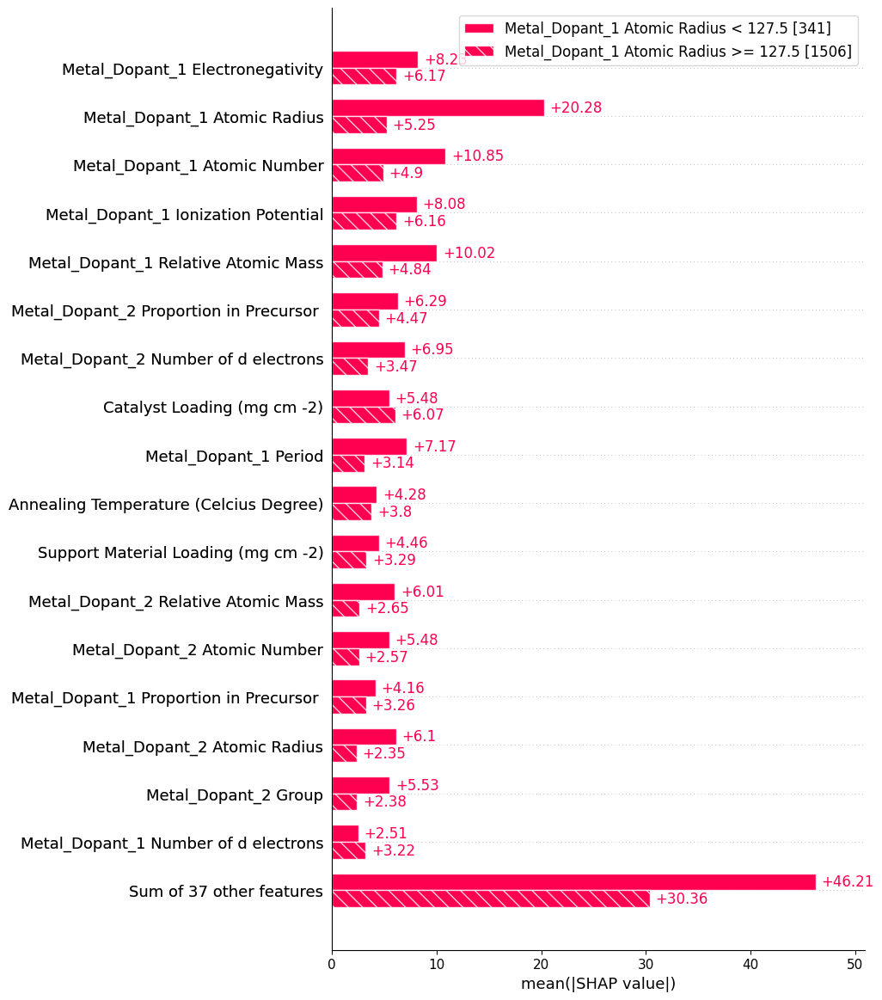

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
55it [01:07,  1.49s/it]                                                                                                


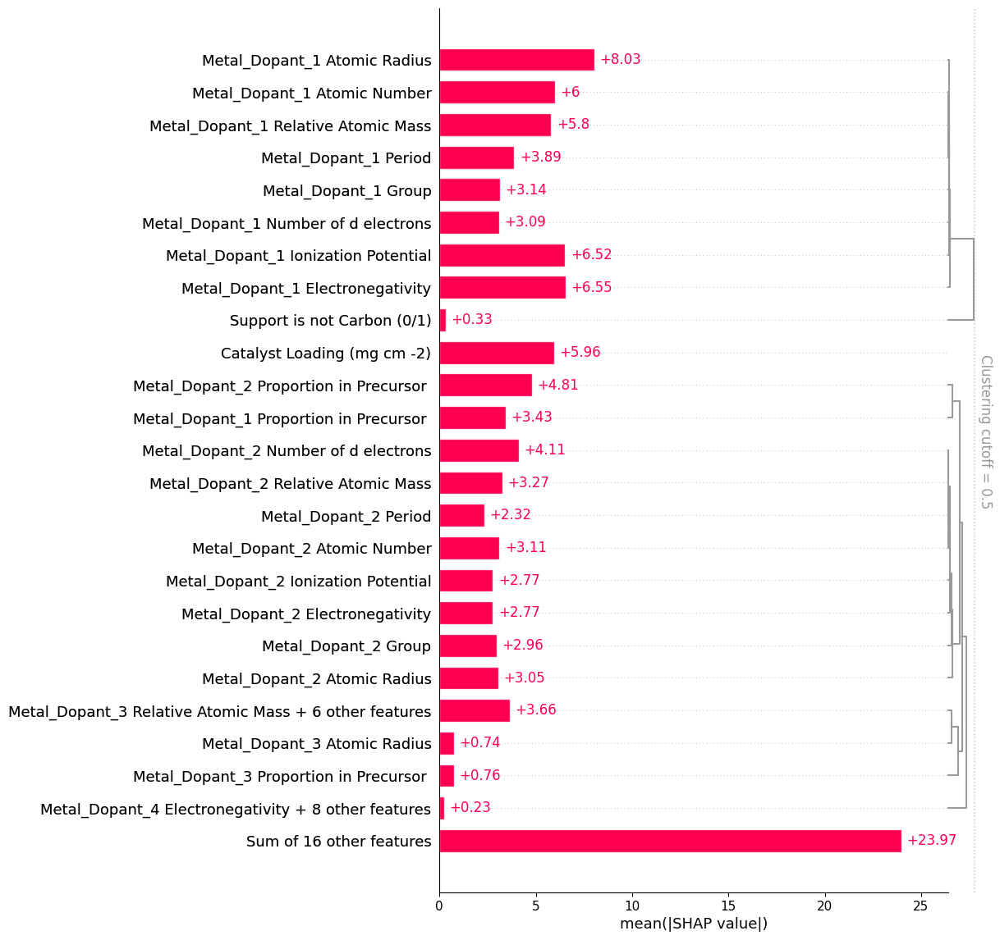

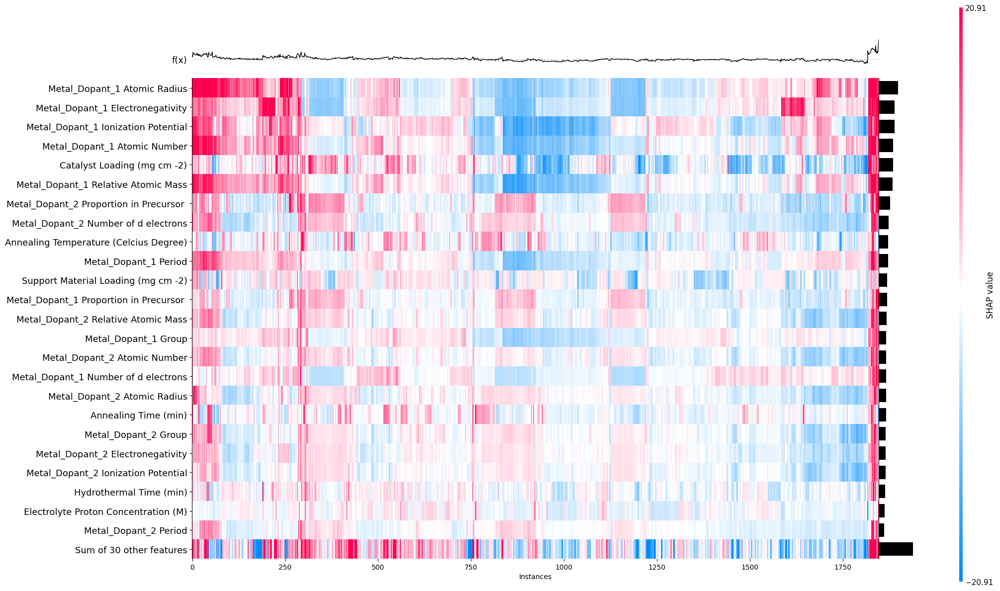

In [21]:
###############################################################################################################################
######################################################Random Forest############################################################
###############################################################################################################################

################################
#############overall############
################################
explainer = shap.TreeExplainer(RF_full, data_input_full)
shap_values_RF = explainer(data_input_full,check_additivity=False)
#####summary plot#####
shap.summary_plot(shap_values_RF,feature_names=list(data_input_full.columns),max_display=25,alpha=0.5)
#####cohorts plot#####
RF_v = shap_values_RF.cohorts(2).abs.mean(0)
shap.plots.bar(RF_v,max_display=18)
#####clustered plot#####
clustering = shap.utils.hclust(data_input_full, data_output_full) 
shap.plots.bar(shap_values_RF, max_display=25,clustering=clustering,clustering_cutoff=0.5)
#####heat map#####
shap.plots.heatmap(shap_values_RF,max_display=25,plot_width=20)

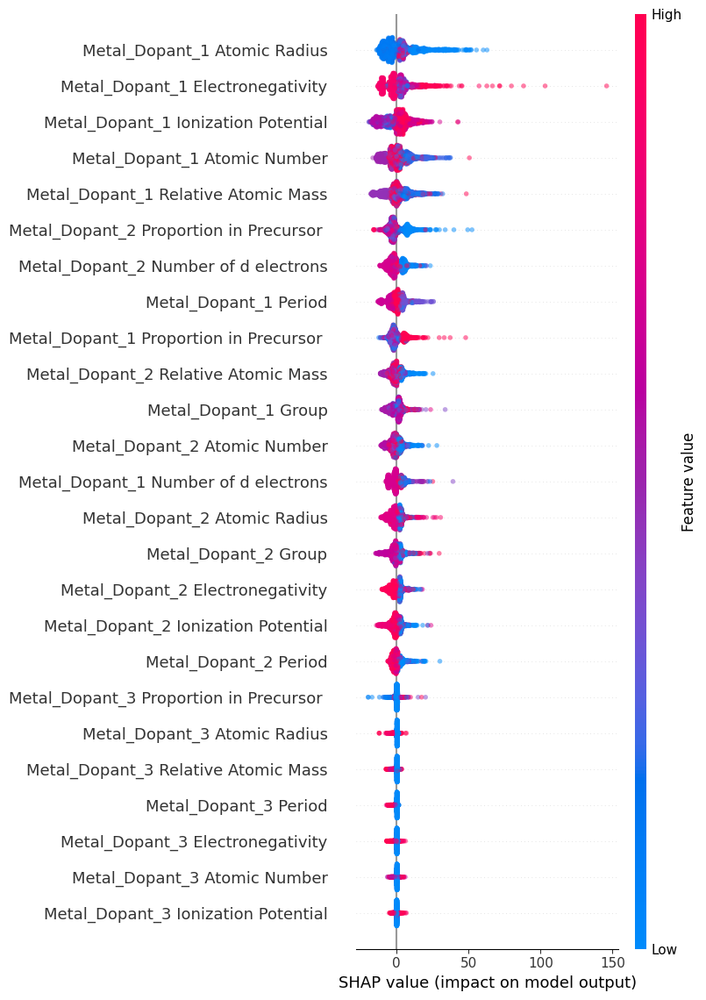

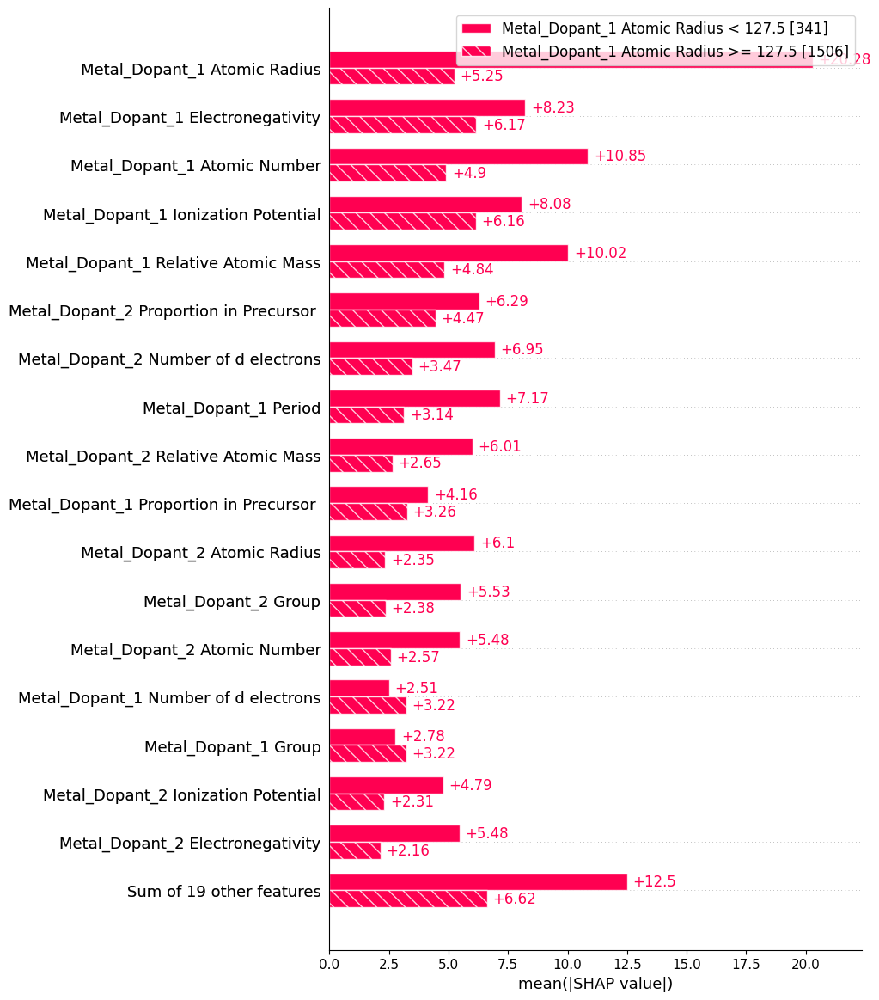

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
37it [00:45,  1.74s/it]                                                                                                


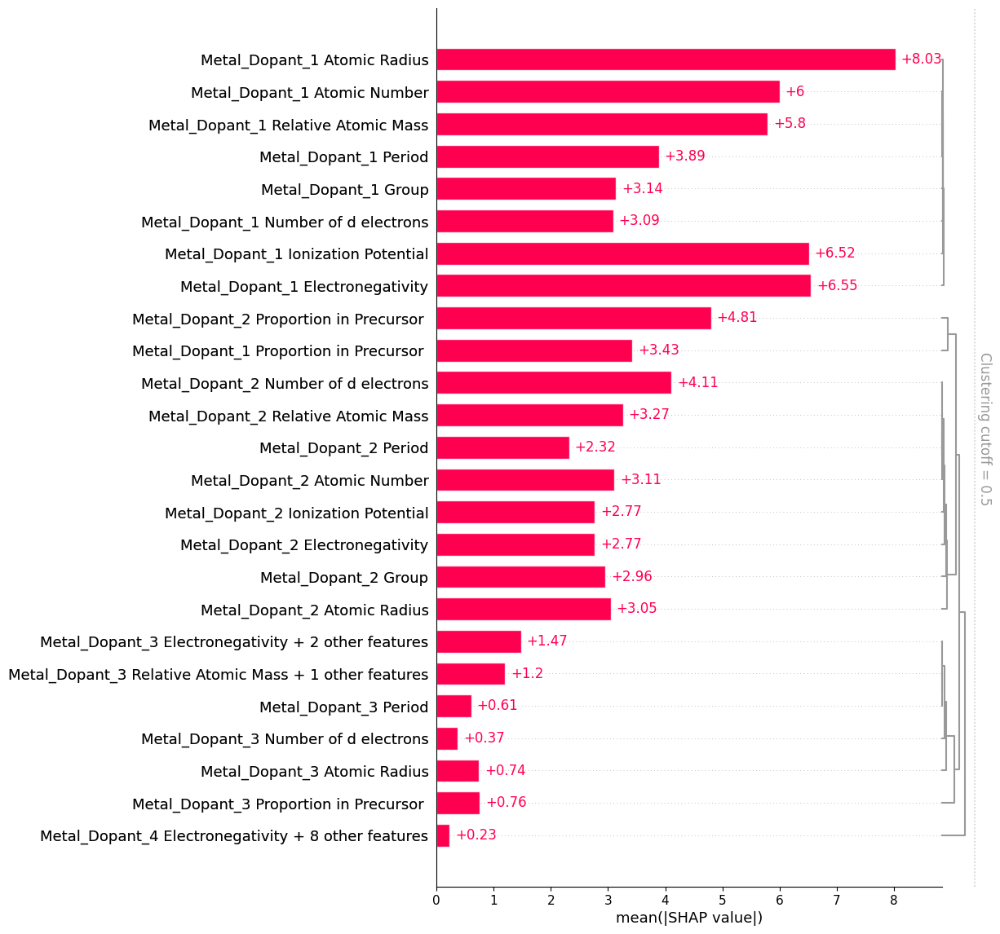

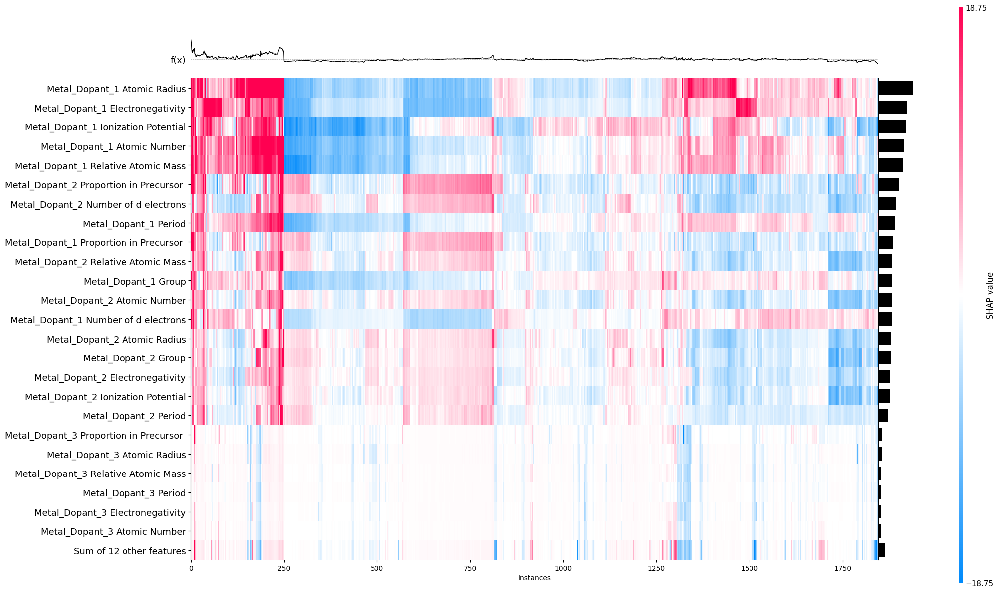

In [22]:
###############################################################################################################################
######################################################Random Forest############################################################
###############################################################################################################################

################################
#############ELEMENT############
################################
shap_values_RF_ELE = shap_values_RF[:,0:36]
#####summary plot#####
shap.summary_plot(shap_values_RF_ELE,feature_names=list(ELE.columns),max_display=25,alpha=0.5)
#####cohorts plot#####
RF_v = shap_values_RF_ELE.cohorts(2).abs.mean(0)
shap.plots.bar(RF_v,max_display=18)
#####clustered plot#####
clustering = shap.utils.hclust(ELE, data_output_full) 
shap.plots.bar(shap_values_RF_ELE, max_display=25,clustering=clustering,clustering_cutoff=0.5)
#####heat map#####
shap.plots.heatmap(shap_values_RF_ELE,max_display=25,plot_width=20)

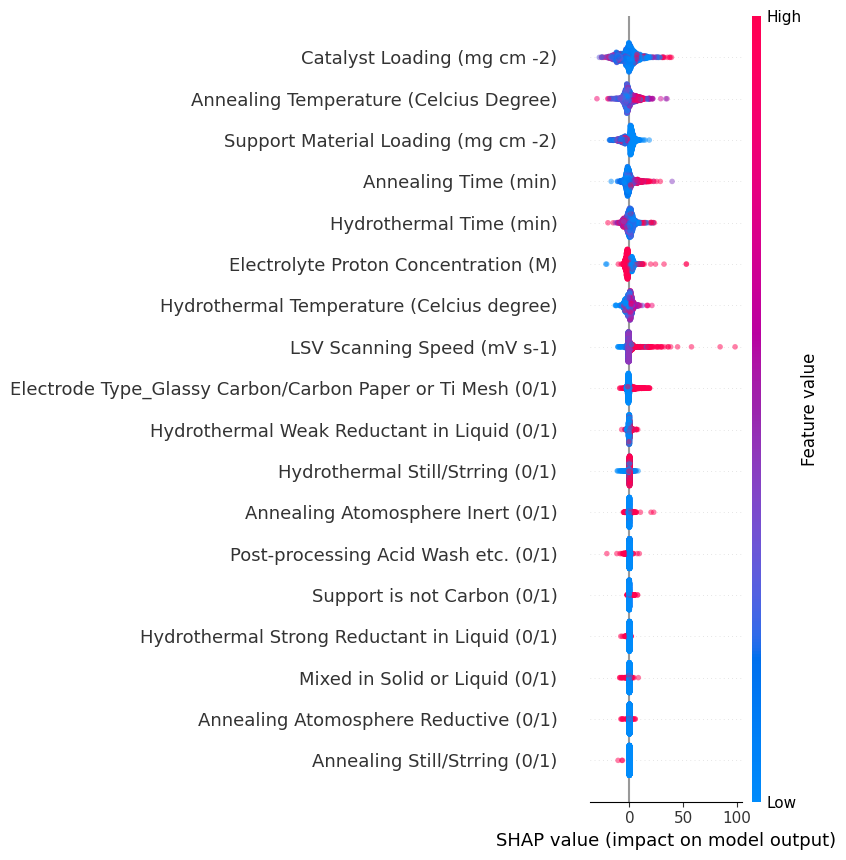

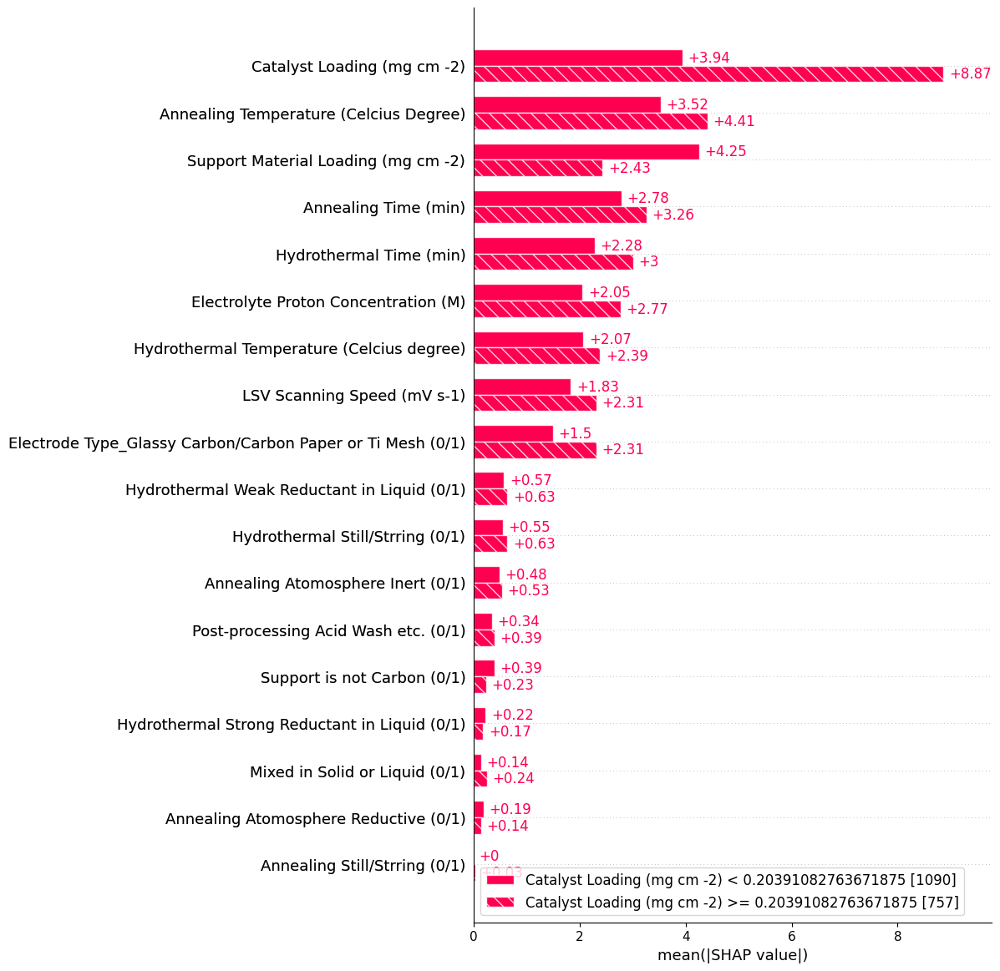

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


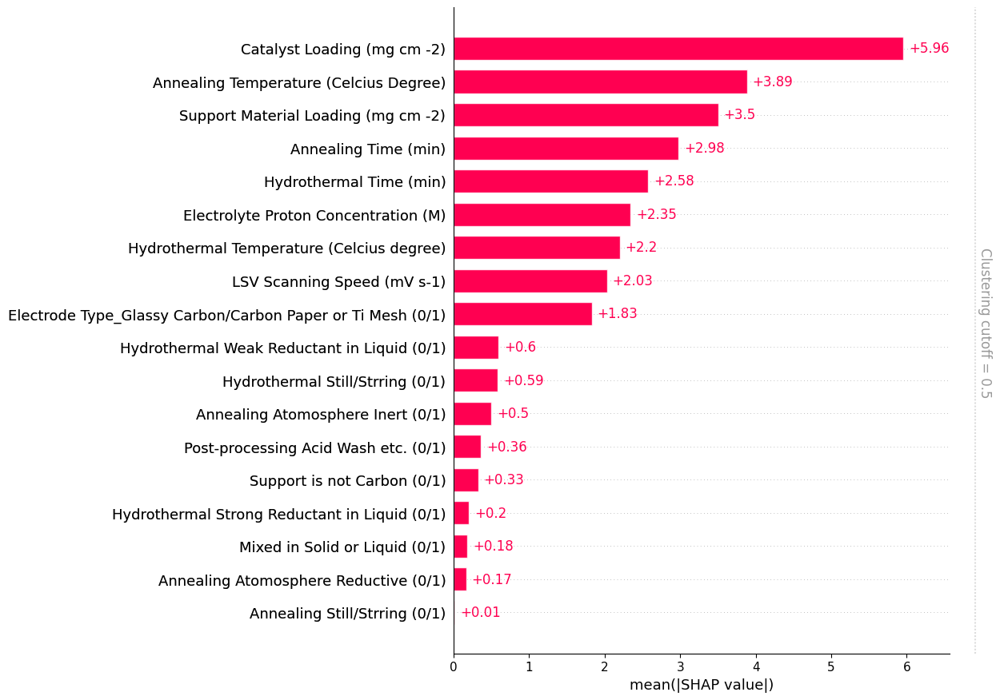

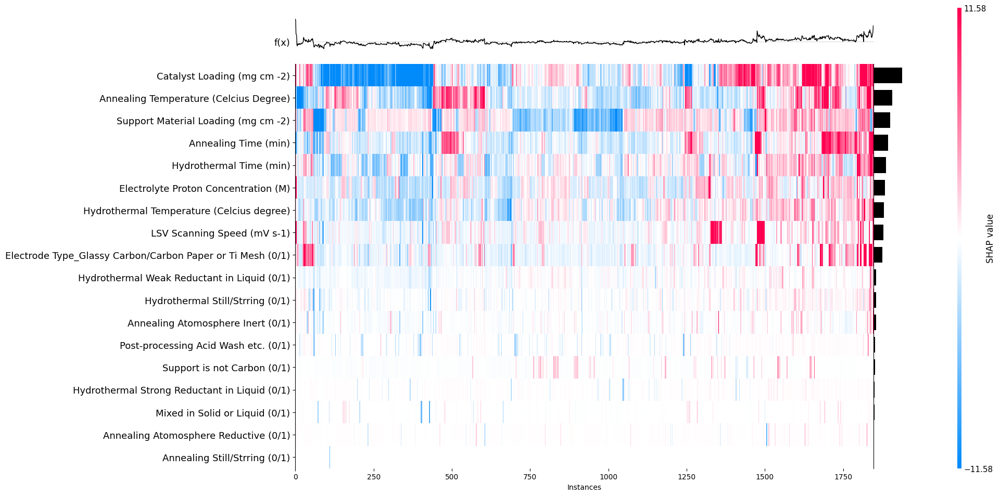

In [23]:
###############################################################################################################################
######################################################Random Forest############################################################
###############################################################################################################################

################################
#############SYNTHESIS##########
################################
shap_values_RF_SYN = shap_values_RF[:,36:]
#####summary plot#####
shap.summary_plot(shap_values_RF_SYN,feature_names=list(SYN.columns),max_display=25,alpha=0.5)
#####cohorts plot#####
RF_v = shap_values_RF_SYN.cohorts(2).abs.mean(0)
shap.plots.bar(RF_v,max_display=18)
#####clustered plot#####
clustering = shap.utils.hclust(SYN, data_output_full) 
shap.plots.bar(shap_values_RF_SYN, max_display=25,clustering=clustering,clustering_cutoff=0.5)
#####heat map#####
shap.plots.heatmap(shap_values_RF_SYN,max_display=25,plot_width=20)

In [24]:
weighted_SHAP_ALL=(float(GB_full_score)*shap_values_GB+float(RF_full_score)*shap_values_RF+float(LGBM_full_score)*shap_values_LGBM)/(GB_full_score+RF_full_score+LGBM_full_score)
weighted_SHAP_ELE=(float(GB_full_score)*shap_values_GB_ELE+float(RF_full_score)*shap_values_RF_ELE+float(LGBM_full_score)*shap_values_LGBM_ELE)/(GB_full_score+RF_full_score+LGBM_full_score)
weighted_SHAP_SYN=(float(GB_full_score)*shap_values_GB_SYN+float(RF_full_score)*shap_values_RF_SYN+float(LGBM_full_score)*shap_values_LGBM_SYN)/(GB_full_score+RF_full_score+LGBM_full_score)

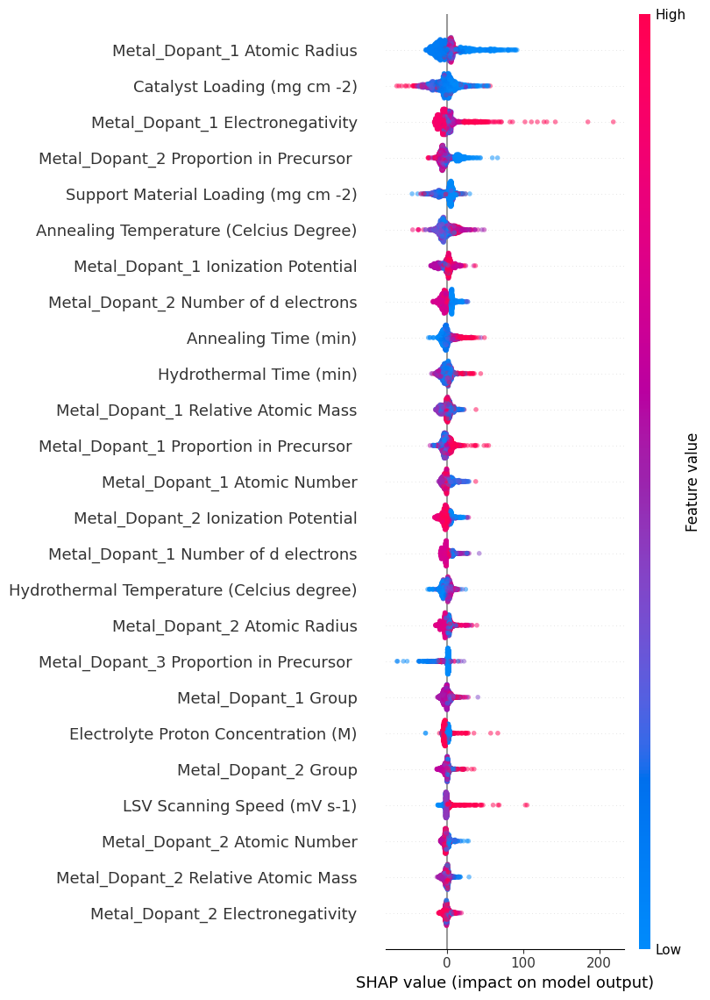

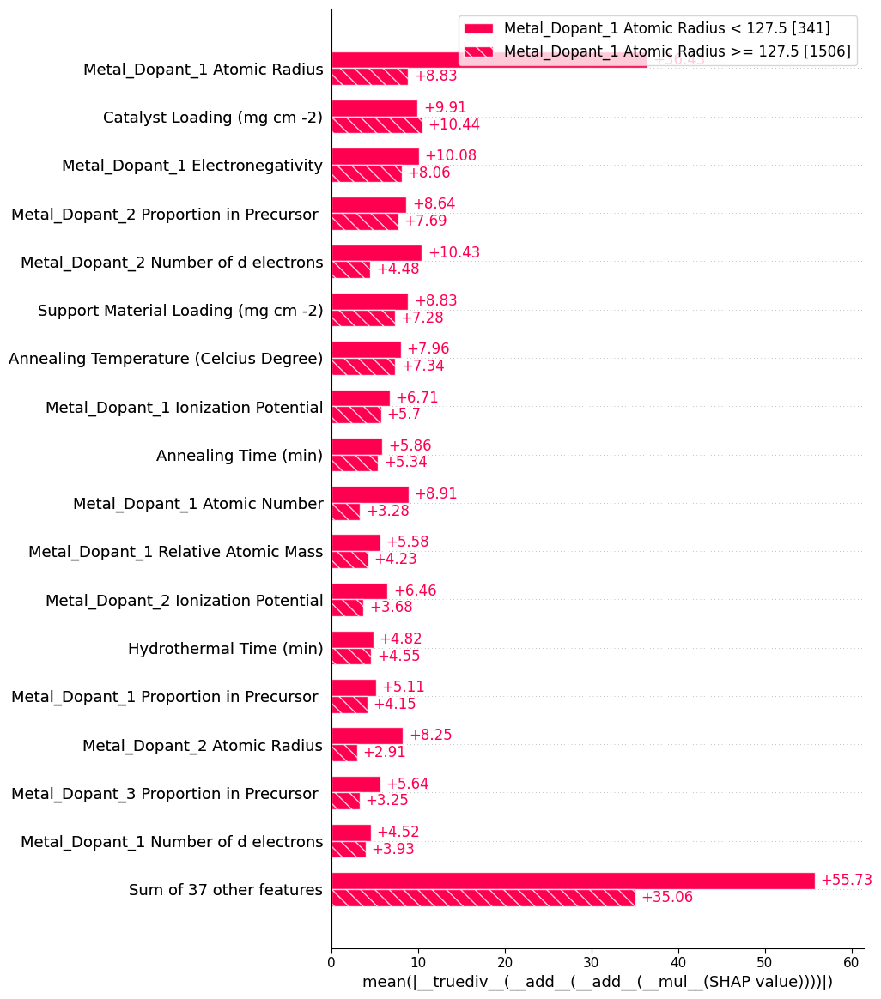

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
55it [01:06,  1.48s/it]                                                                                                


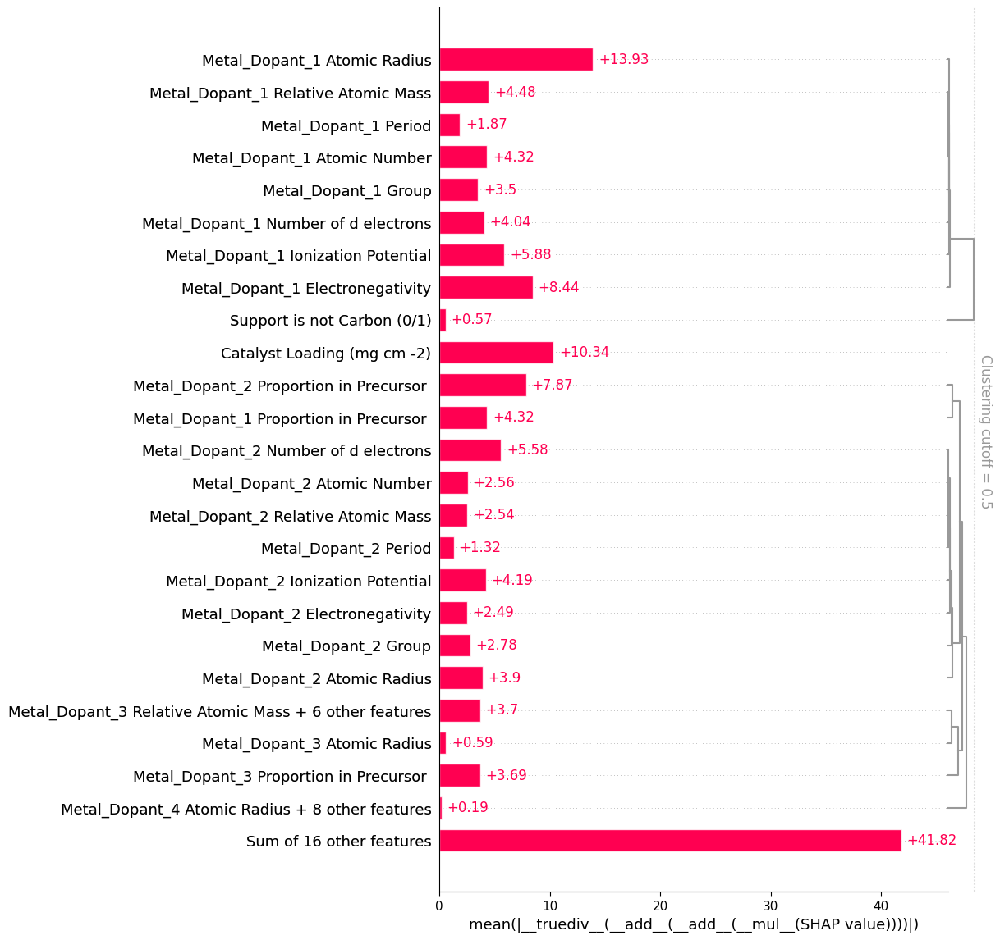

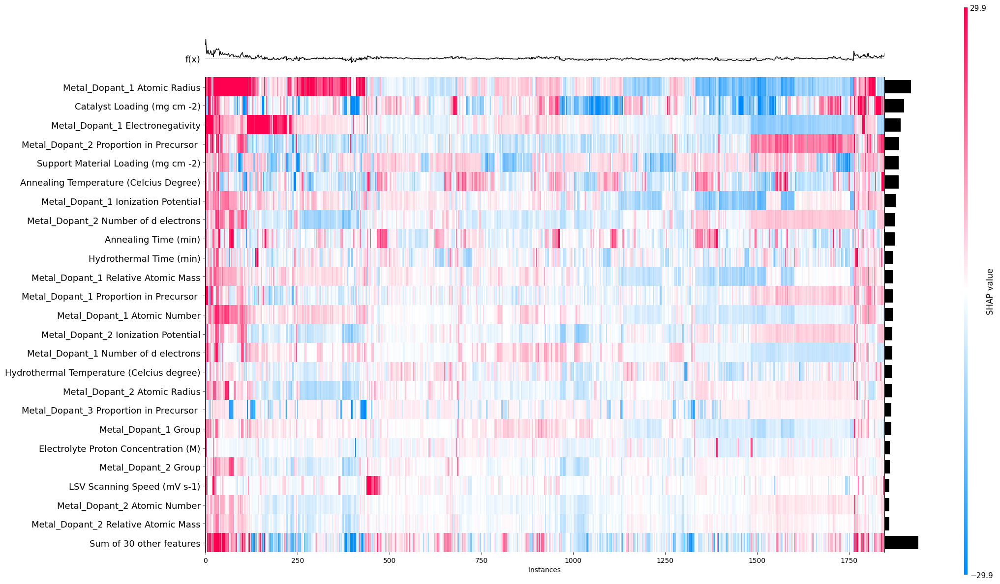

In [25]:
###############################################################################################################################
##################################################Weighted ENSEMBLE############################################################
###############################################################################################################################

################################
#############overall############
################################
#####summary plot#####
shap.summary_plot(weighted_SHAP_ALL,feature_names=list(data_input_full.columns),max_display=25,alpha=0.5)
#####cohorts plot#####
WE_v = weighted_SHAP_ALL.cohorts(2).abs.mean(0)
shap.plots.bar(WE_v,max_display=18)
#####clustered plot#####
clustering = shap.utils.hclust(data_input_full, data_output_full) 
shap.plots.bar(weighted_SHAP_ALL, max_display=25,clustering=clustering,clustering_cutoff=0.5)
#####heat map#####
shap.plots.heatmap(weighted_SHAP_ALL,max_display=25,plot_width=20)

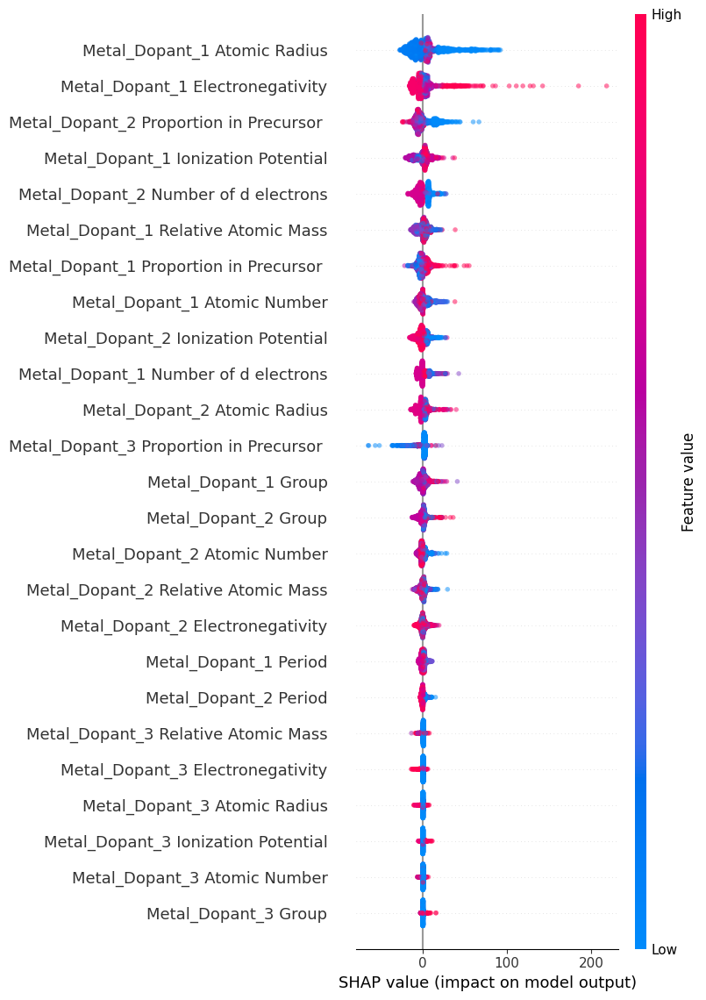

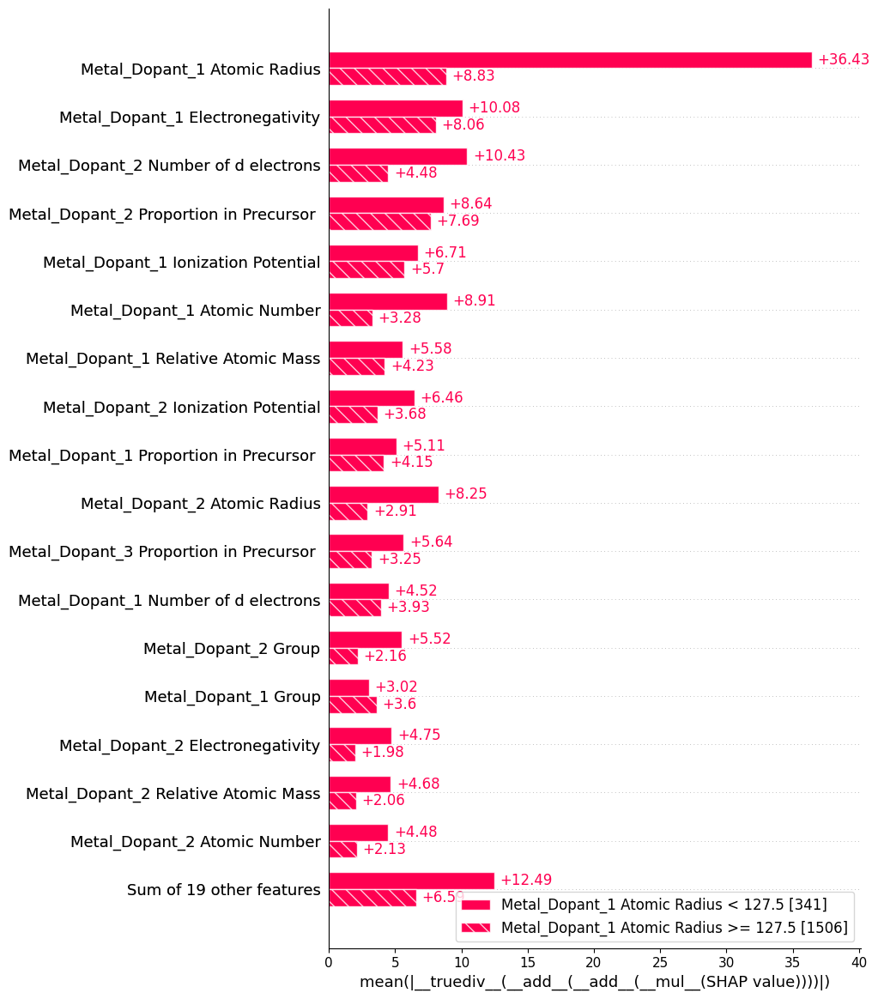

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
37it [00:48,  1.87s/it]                                                                                                


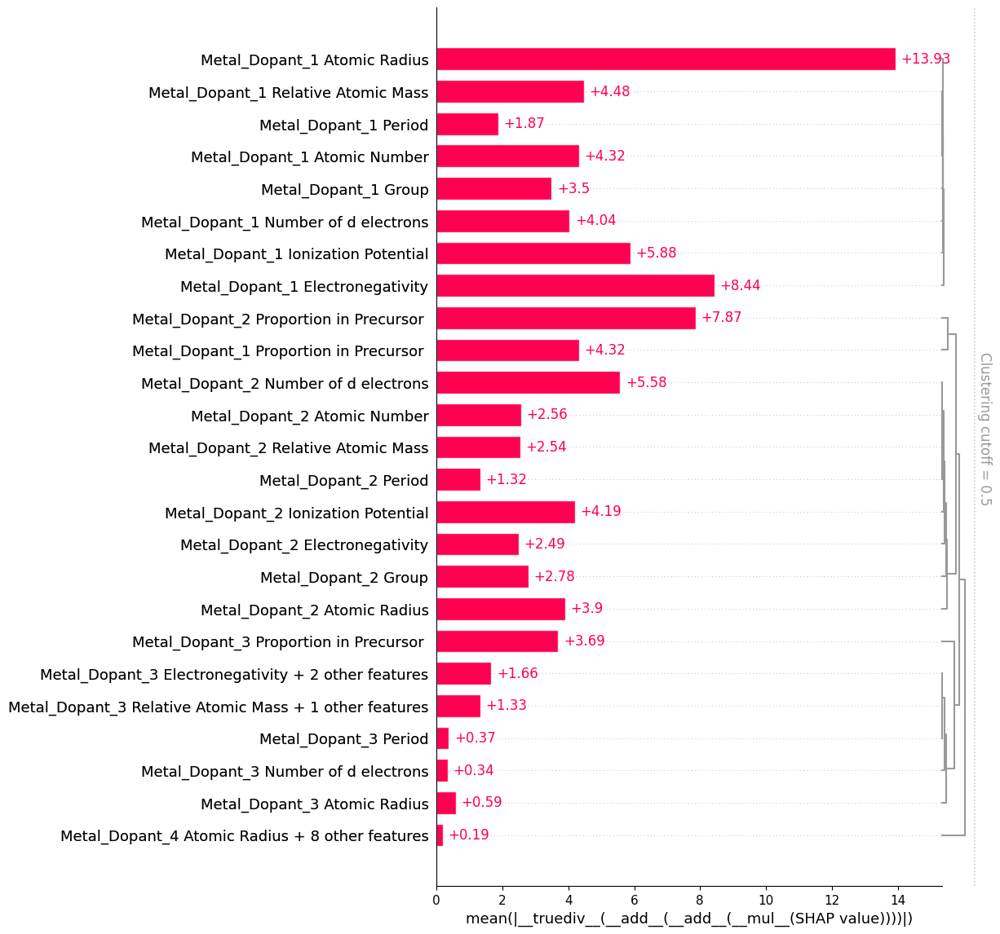

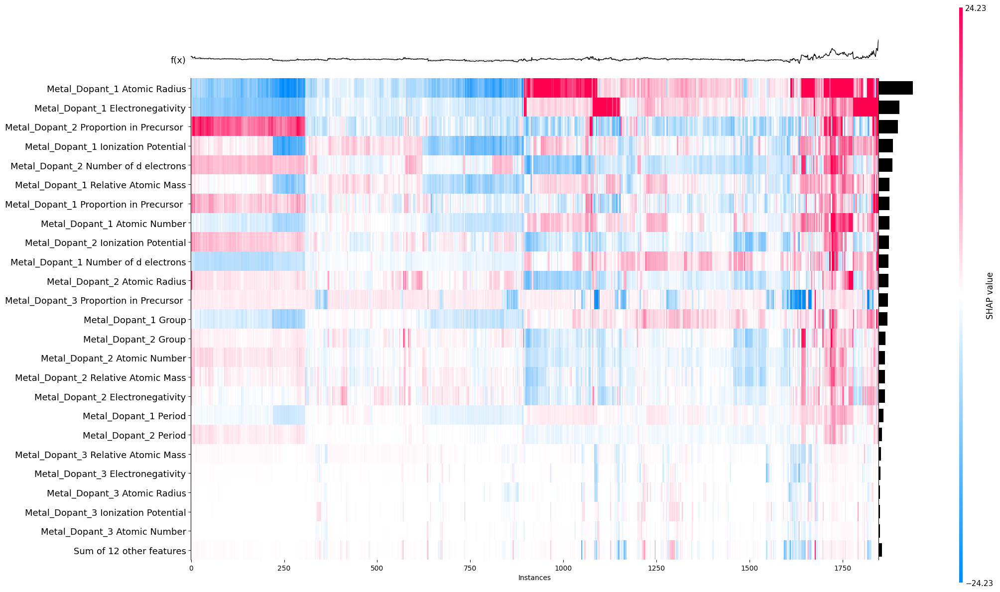

In [26]:
###############################################################################################################################
##################################################Weighted ENSEMBLE############################################################
###############################################################################################################################

################################
#############ELEMENT############
################################
#####summary plot#####
shap.summary_plot(weighted_SHAP_ELE,feature_names=list(ELE.columns),max_display=25,alpha=0.5)
#####cohorts plot#####
WE_v = weighted_SHAP_ELE.cohorts(2).abs.mean(0)
shap.plots.bar(WE_v,max_display=18)
#####clustered plot#####
clustering = shap.utils.hclust(ELE, data_output_full) 
shap.plots.bar(weighted_SHAP_ELE, max_display=25,clustering=clustering,clustering_cutoff=0.5)
#####heat map#####
shap.plots.heatmap(weighted_SHAP_ELE,max_display=25,plot_width=20)

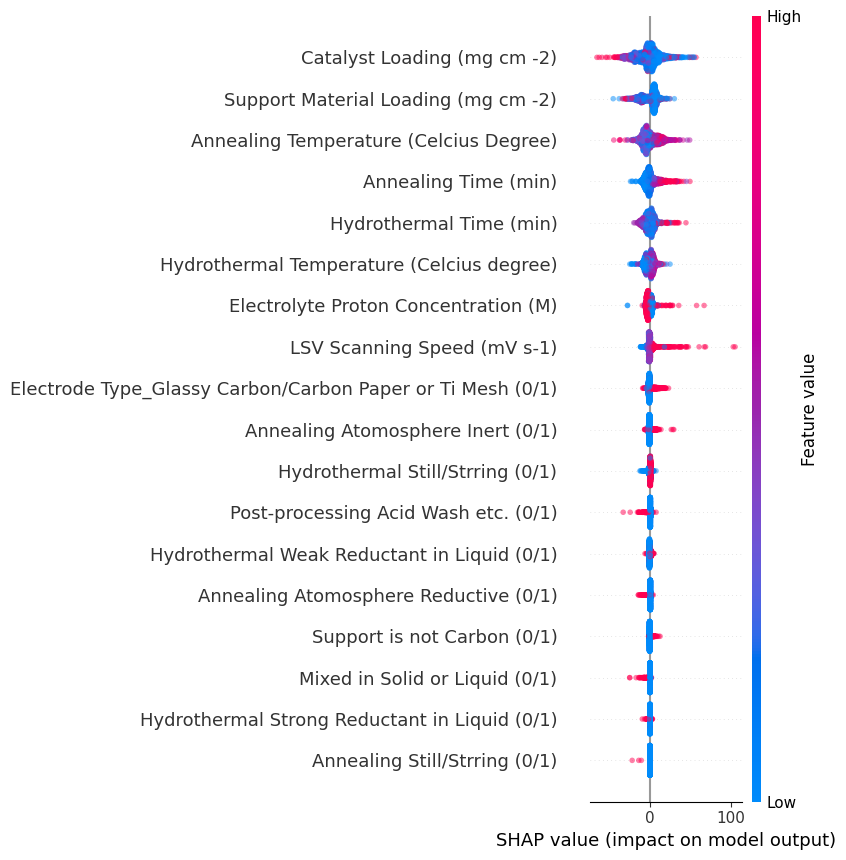

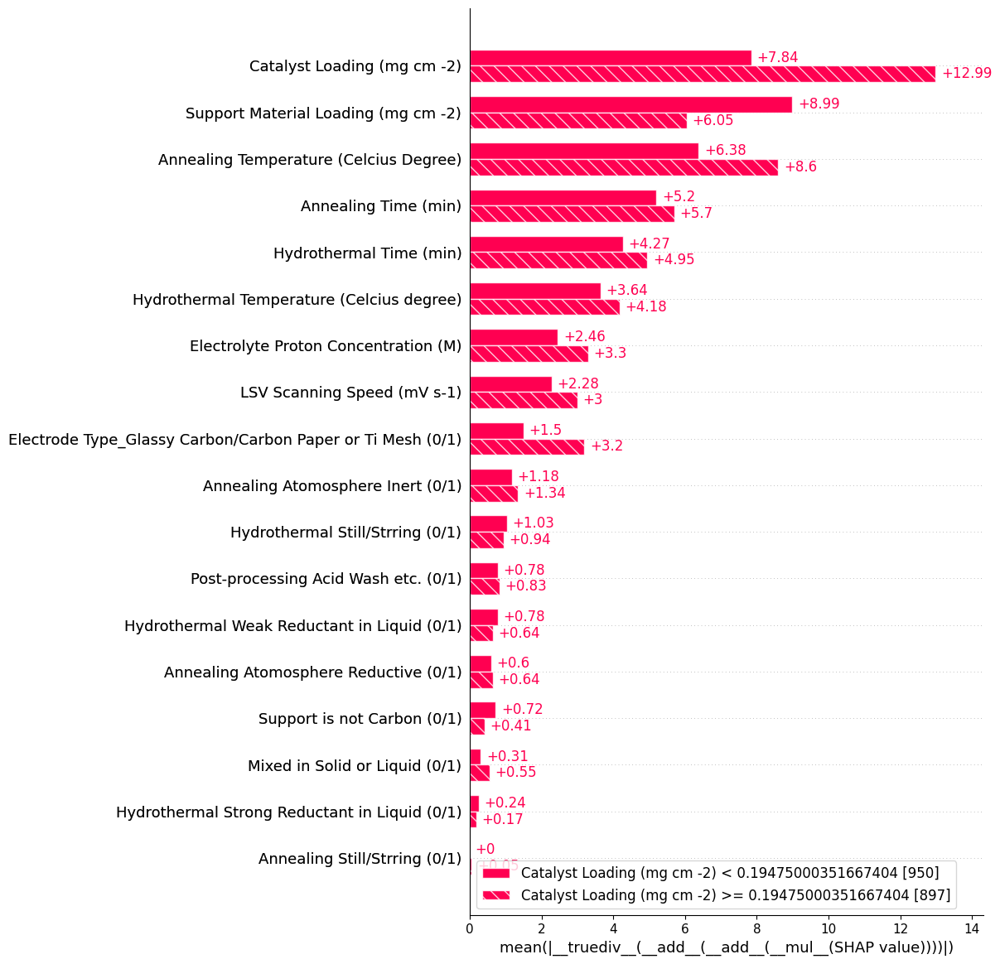

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


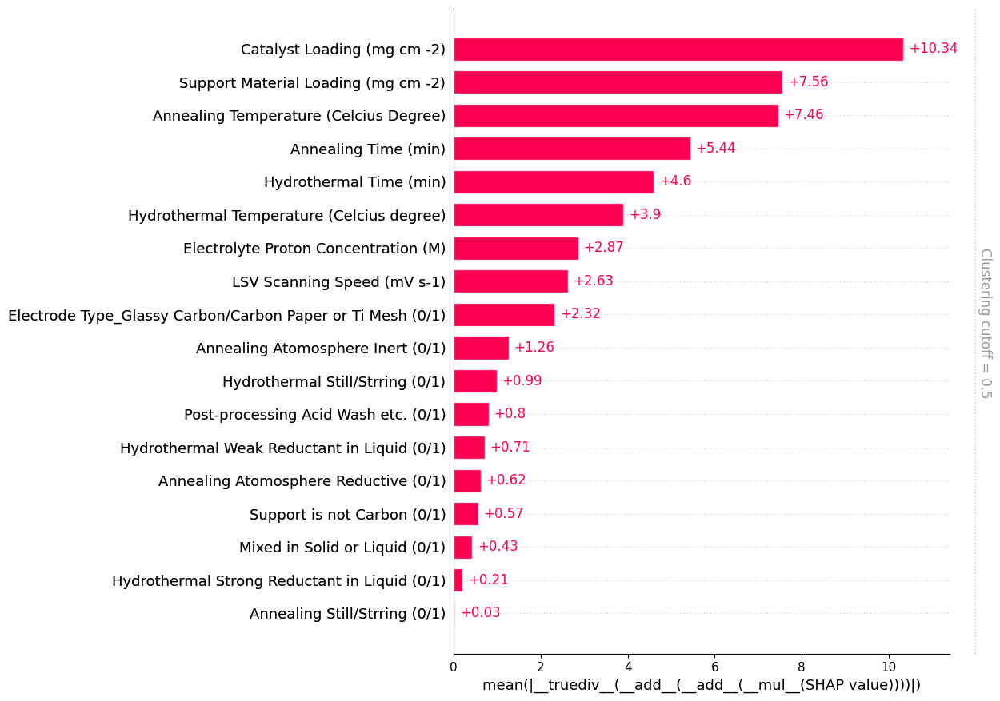

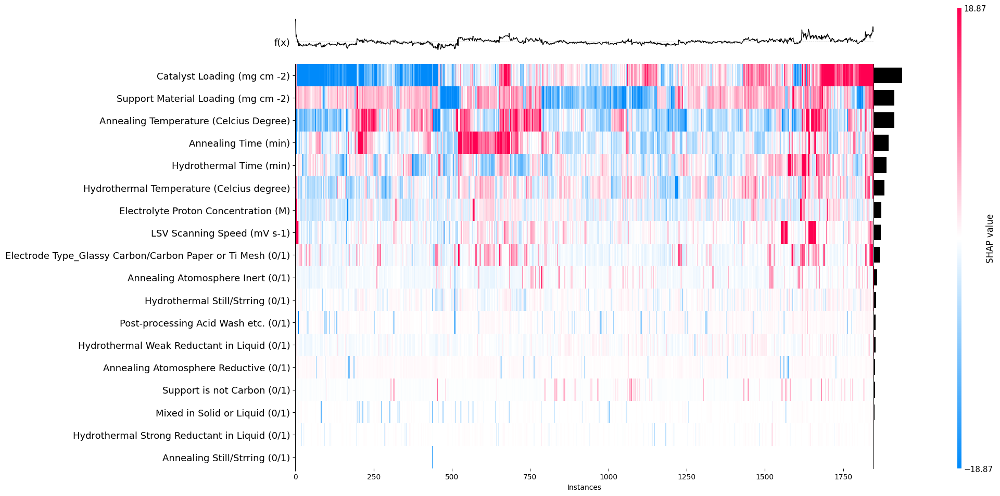

In [27]:
###############################################################################################################################
##################################################Weighted ENSEMBLE############################################################
###############################################################################################################################

################################
#############SYNTHESIS##########
################################
#####summary plot#####
shap.summary_plot(weighted_SHAP_SYN,feature_names=list(SYN.columns),max_display=25,alpha=0.5)
#####cohorts plot#####
WE_v = weighted_SHAP_SYN.cohorts(2).abs.mean(0)
shap.plots.bar(WE_v,max_display=18)
#####clustered plot#####
clustering = shap.utils.hclust(SYN, data_output_full) 
shap.plots.bar(weighted_SHAP_SYN, max_display=25,clustering=clustering,clustering_cutoff=0.5)
#####heat map#####
shap.plots.heatmap(weighted_SHAP_SYN,max_display=25,plot_width=20)

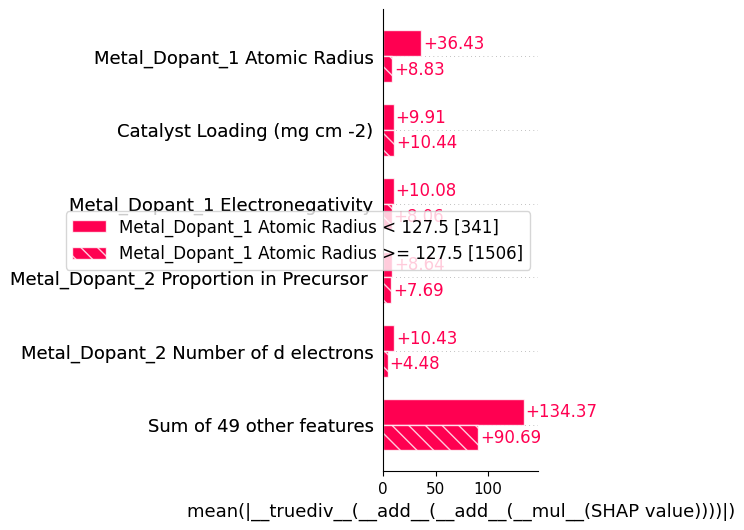

In [28]:
###############################################################################################################################
##################################################Weighted ENSEMBLE############################################################
###############################################################################################################################

################################
#############overall############
################################
#####cohorts plot#####
fig = plt.figure()
WE_v = weighted_SHAP_ALL.cohorts(2).abs.mean(0)
shap.plots.bar(WE_v,max_display=6,show=False)
plt.gcf().set_size_inches(2,6)
plt.show()

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


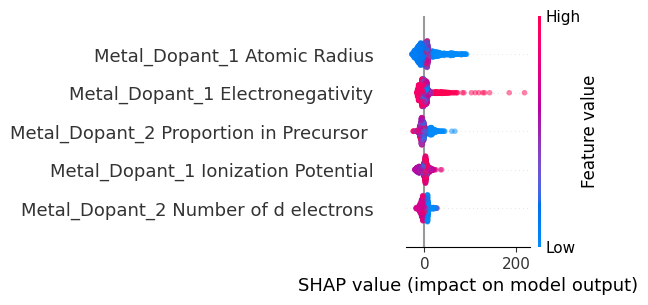

In [29]:
###############################################################################################################################
##################################################Weighted ENSEMBLE############################################################
###############################################################################################################################

################################
#############ELEMENT############
################################
#####summary plot#####
shap.summary_plot(weighted_SHAP_ELE,feature_names=list(ELE.columns),max_display=5,alpha=0.5,plot_size=(2,3))

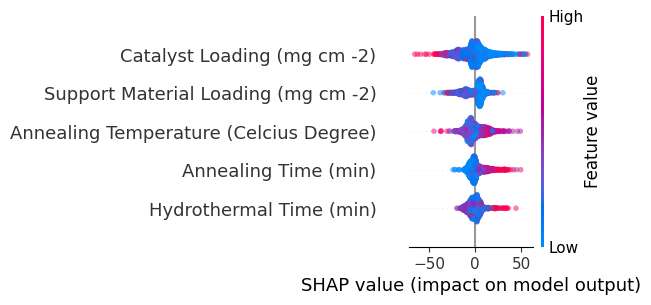

In [30]:
###############################################################################################################################
##################################################Weighted ENSEMBLE############################################################
###############################################################################################################################

################################
#############SYNTHESIS##########
################################
#####summary plot#####
shap.summary_plot(weighted_SHAP_SYN,feature_names=list(SYN.columns),max_display=5,alpha=0.5,plot_size=(2,3))

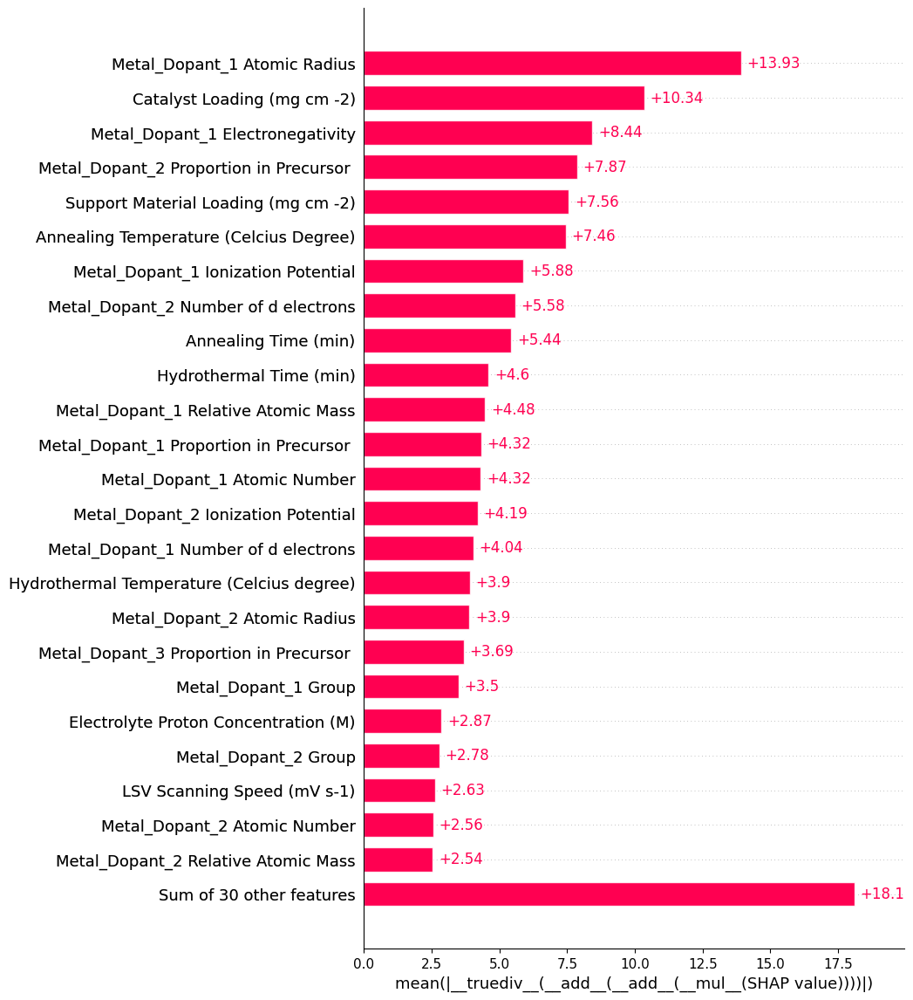

In [39]:
#####overall weighted ranking####
shap.plots.bar(weighted_SHAP_ALL,max_display=25)

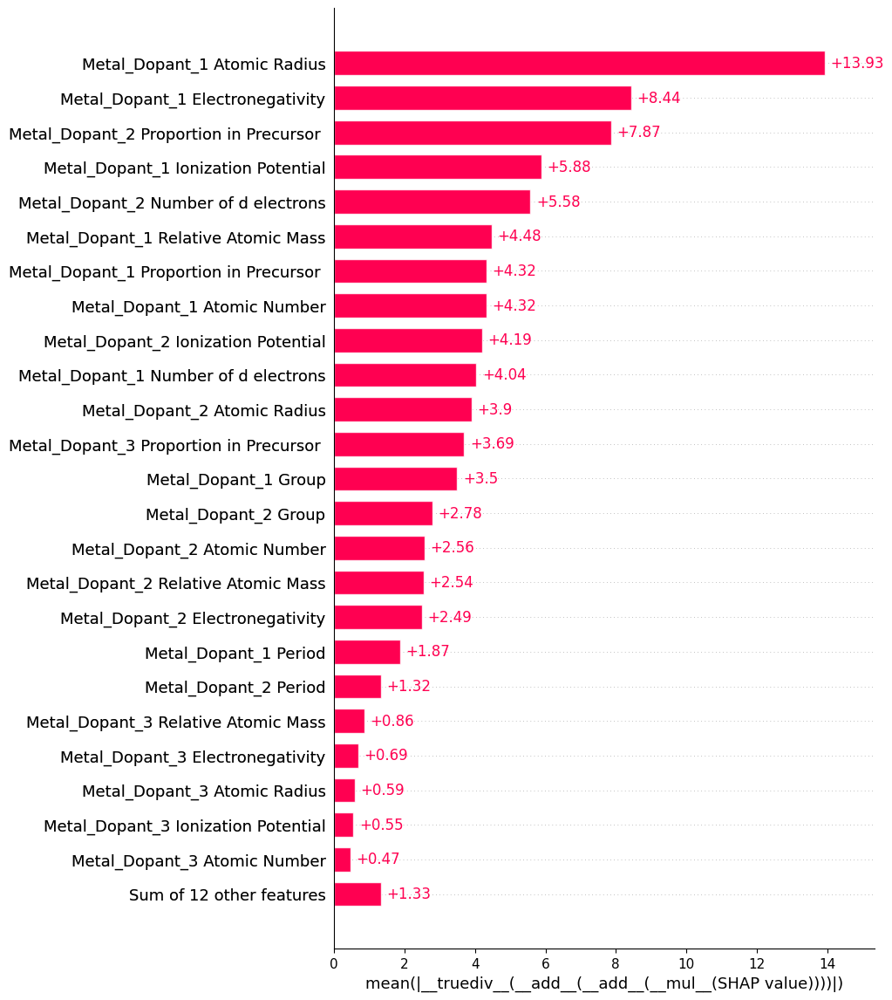

In [32]:
shap.plots.bar(weighted_SHAP_ELE,max_display=25)

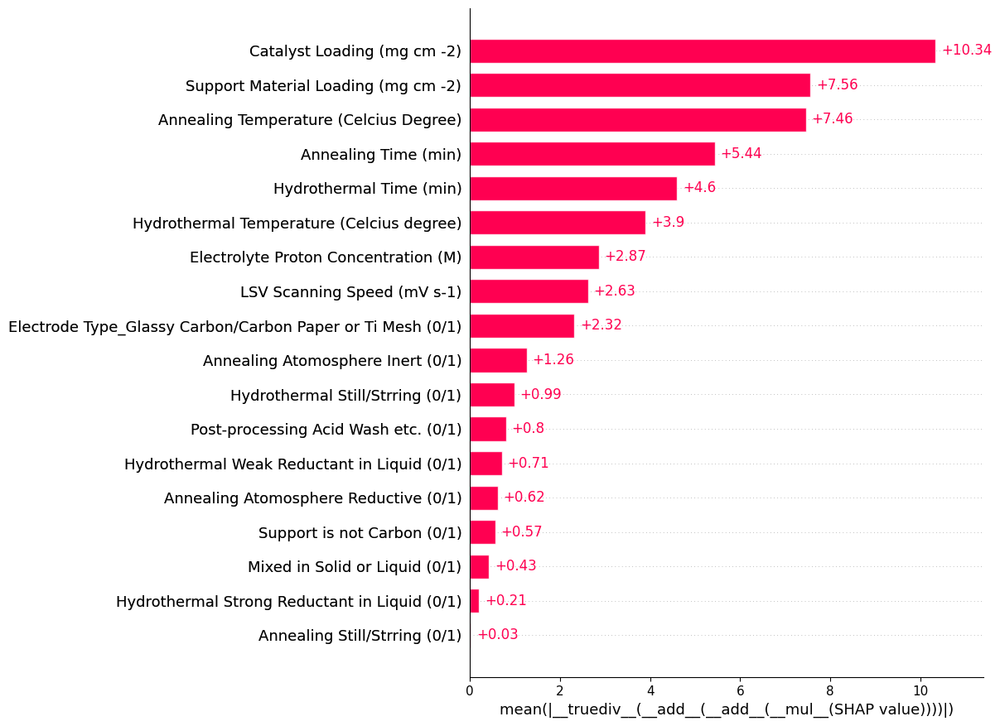

In [33]:
shap.plots.bar(weighted_SHAP_SYN,max_display=25)

In [65]:
data_input_full.columns

Index(['Metal_Dopant_1 Relative Atomic Mass', 'Metal_Dopant_1 Atomic Number',
       'Metal_Dopant_1 Period', 'Metal_Dopant_1 Group',
       'Metal_Dopant_1 Ionization Potential',
       'Metal_Dopant_1 Electronegativity',
       'Metal_Dopant_1 Number of d electrons', 'Metal_Dopant_1 Atomic Radius',
       'Metal_Dopant_2 Relative Atomic Mass', 'Metal_Dopant_2 Atomic Number',
       'Metal_Dopant_2 Period', 'Metal_Dopant_2 Group',
       'Metal_Dopant_2 Ionization Potential',
       'Metal_Dopant_2 Electronegativity',
       'Metal_Dopant_2 Number of d electrons', 'Metal_Dopant_2 Atomic Radius',
       'Metal_Dopant_3 Relative Atomic Mass', 'Metal_Dopant_3 Atomic Number',
       'Metal_Dopant_3 Period', 'Metal_Dopant_3 Group',
       'Metal_Dopant_3 Ionization Potential',
       'Metal_Dopant_3 Electronegativity',
       'Metal_Dopant_3 Number of d electrons', 'Metal_Dopant_3 Atomic Radius',
       'Metal_Dopant_4 Relative Atomic Mass', 'Metal_Dopant_4 Atomic Number',
       'Metal_Do

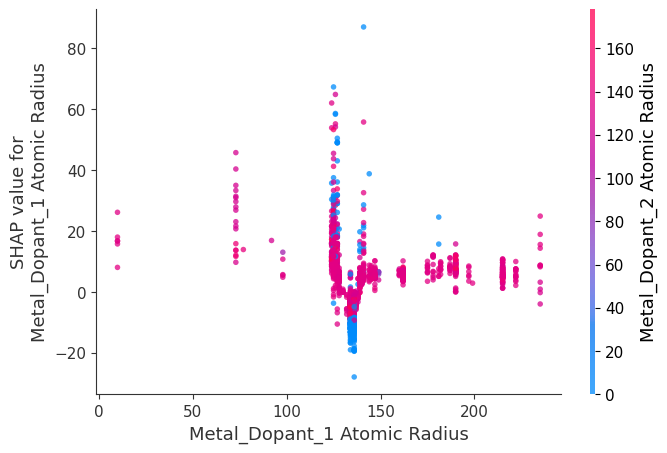

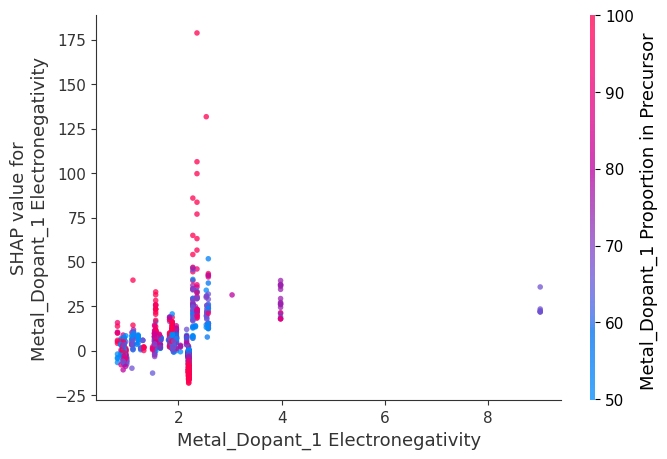

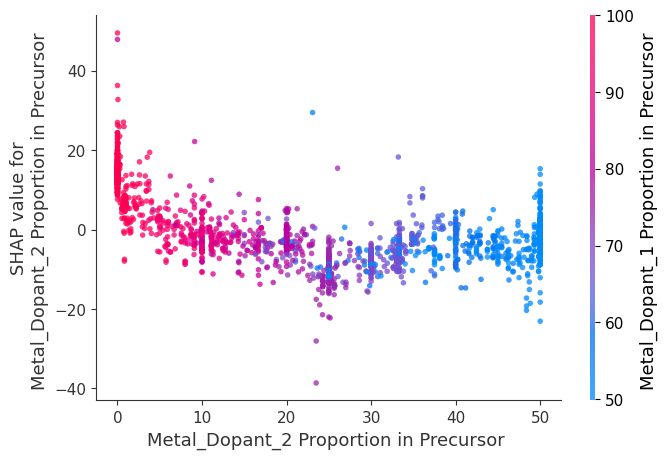

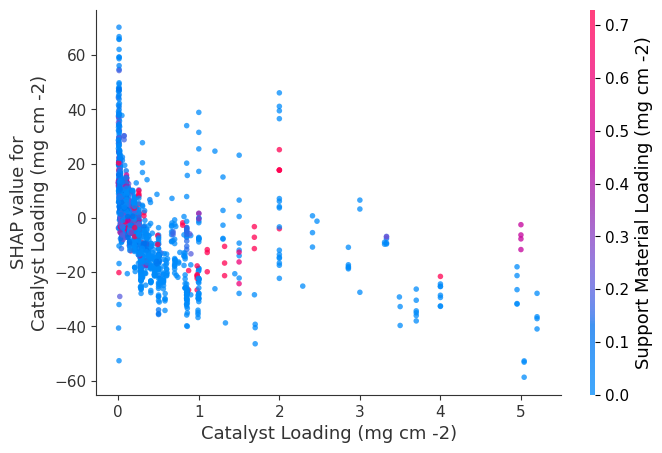

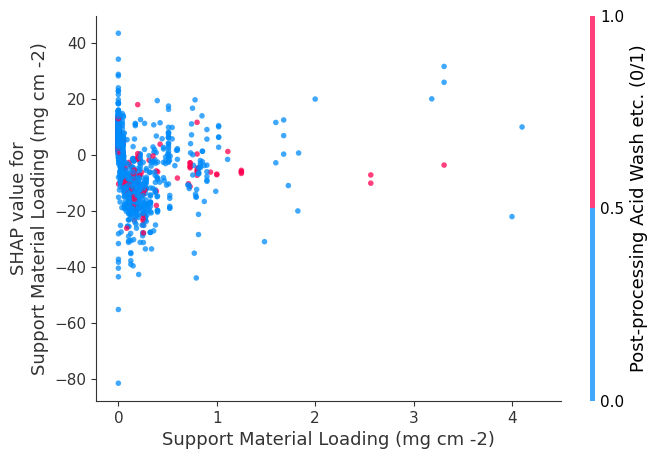

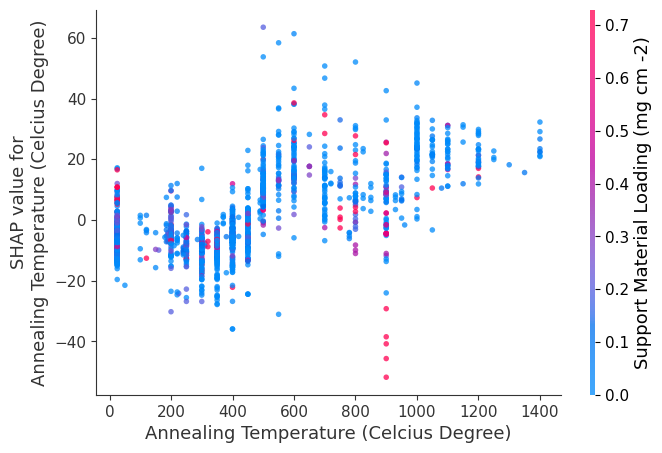

In [35]:
###############################################################################################################
shap.dependence_plot('Metal_Dopant_1 Atomic Radius', shap_values_GB.values, data_input_full,
                     interaction_index='Metal_Dopant_2 Atomic Radius',alpha=0.75)
shap.dependence_plot('Metal_Dopant_1 Electronegativity', shap_values_GB.values, data_input_full,
                     interaction_index='Metal_Dopant_1 Proportion in Precursor ',alpha=0.75)
shap.dependence_plot('Metal_Dopant_2 Proportion in Precursor ', shap_values_GB.values, data_input_full,
                     interaction_index='Metal_Dopant_1 Proportion in Precursor ',alpha=0.75)
###############################################################################################################
shap.dependence_plot('Catalyst Loading (mg cm -2)', shap_values_GB.values, data_input_full,xmax=5.5,
                     interaction_index='Support Material Loading (mg cm -2)',alpha=0.75)
shap.dependence_plot('Support Material Loading (mg cm -2)', shap_values_GB.values, data_input_full,xmax=4.5,
                     interaction_index='Post-processing Acid Wash etc. (0/1)',alpha=0.75)
shap.dependence_plot('Annealing Temperature (Celcius Degree)', shap_values_GB.values, data_input_full,
                     interaction_index='Support Material Loading (mg cm -2)',alpha=0.75)

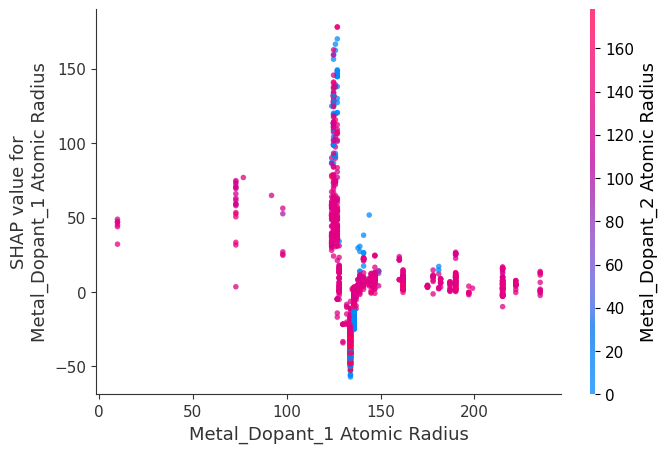

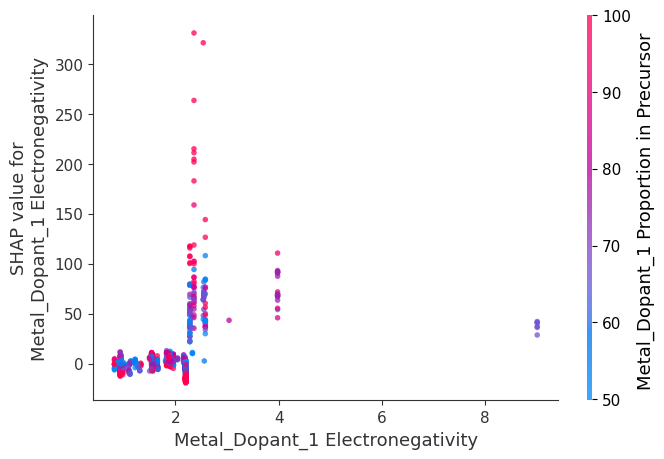

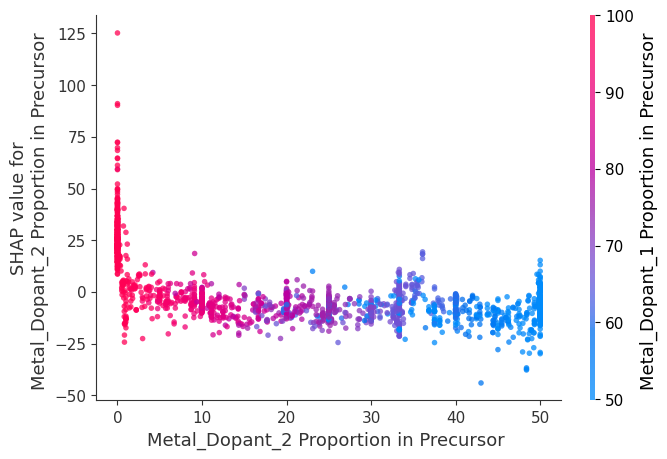

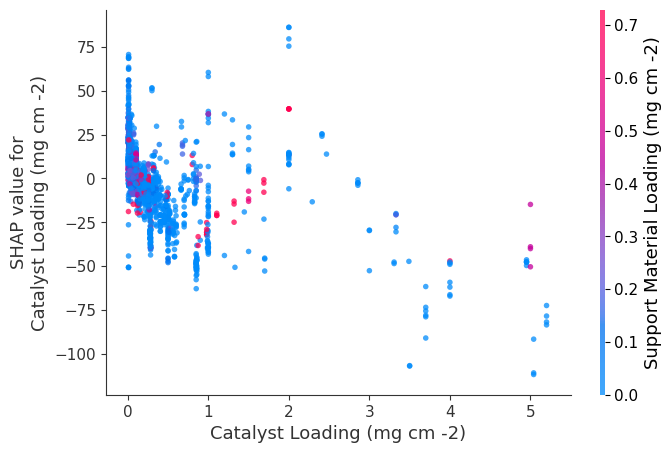

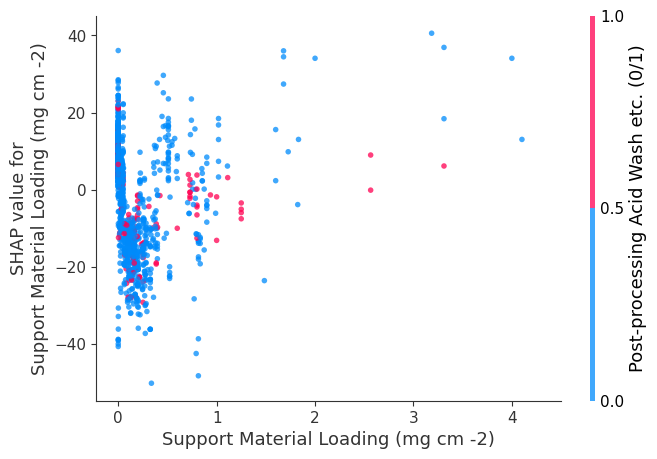

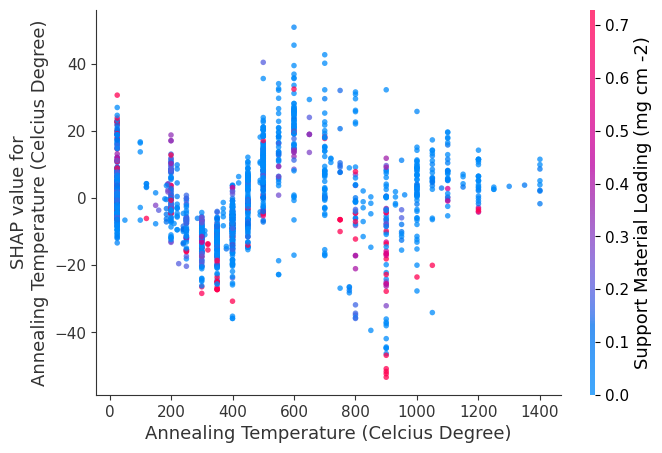

In [36]:
###############################################################################################################
shap.dependence_plot('Metal_Dopant_1 Atomic Radius', shap_values_LGBM.values, data_input_full,
                     interaction_index='Metal_Dopant_2 Atomic Radius',alpha=0.75)
shap.dependence_plot('Metal_Dopant_1 Electronegativity', shap_values_LGBM.values, data_input_full,
                     interaction_index='Metal_Dopant_1 Proportion in Precursor ',alpha=0.75)
shap.dependence_plot('Metal_Dopant_2 Proportion in Precursor ', shap_values_LGBM.values, data_input_full,
                     interaction_index='Metal_Dopant_1 Proportion in Precursor ',alpha=0.75)
###############################################################################################################
shap.dependence_plot('Catalyst Loading (mg cm -2)', shap_values_LGBM.values, data_input_full,xmax=5.5,
                     interaction_index='Support Material Loading (mg cm -2)',alpha=0.75)
shap.dependence_plot('Support Material Loading (mg cm -2)', shap_values_LGBM.values, data_input_full,xmax=4.5,
                     interaction_index='Post-processing Acid Wash etc. (0/1)',alpha=0.75)
shap.dependence_plot('Annealing Temperature (Celcius Degree)', shap_values_LGBM.values, data_input_full,
                     interaction_index='Support Material Loading (mg cm -2)',alpha=0.75)

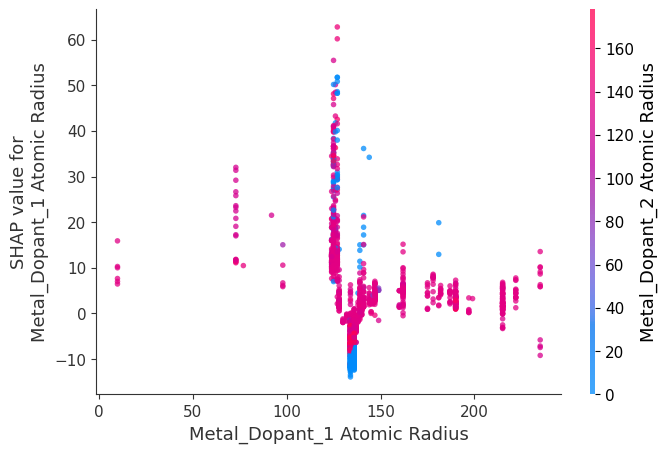

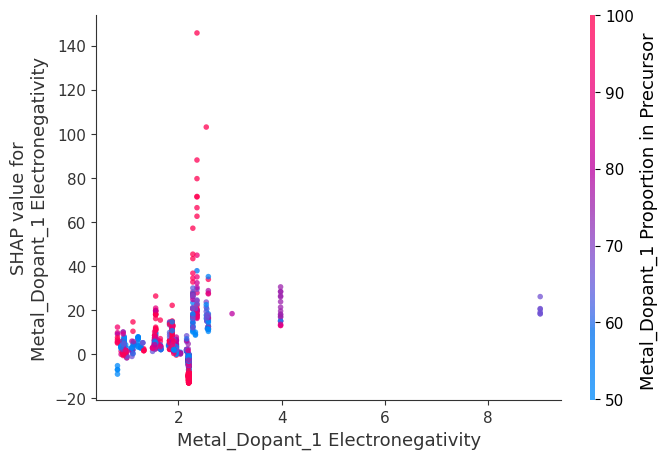

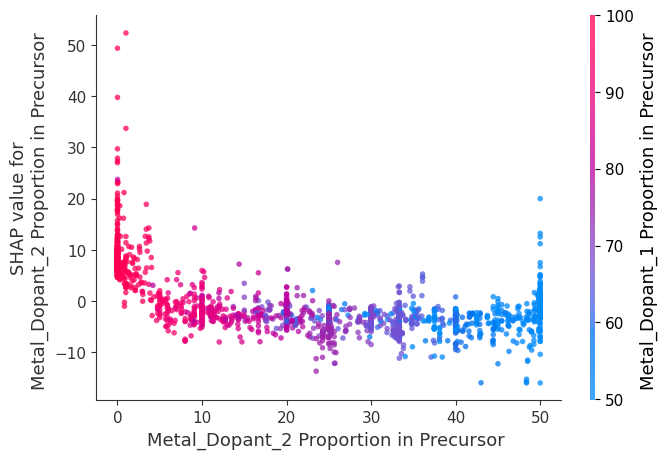

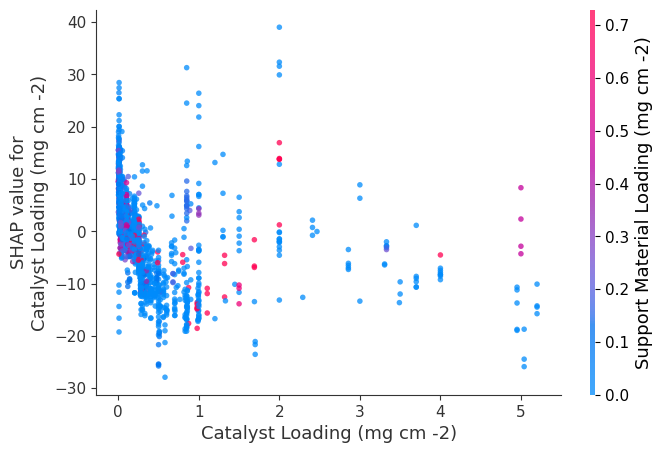

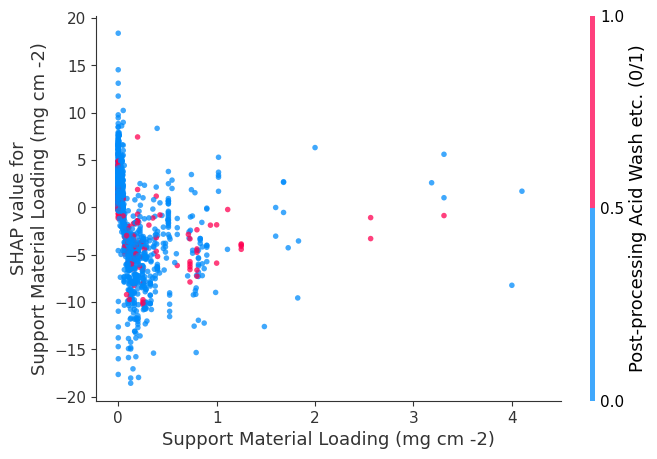

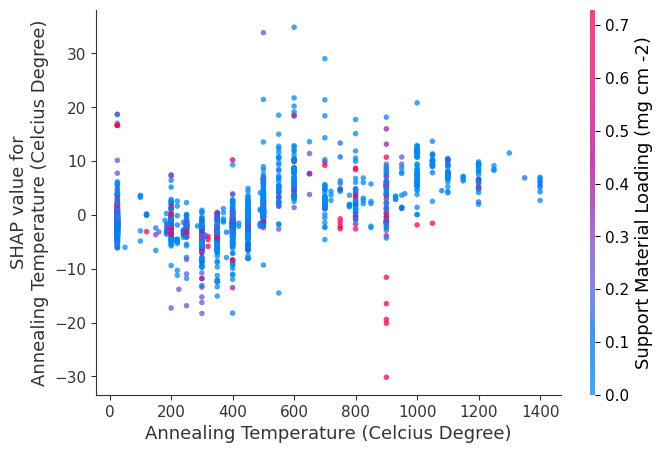

In [37]:
###############################################################################################################
shap.dependence_plot('Metal_Dopant_1 Atomic Radius', shap_values_RF.values, data_input_full,
                     interaction_index='Metal_Dopant_2 Atomic Radius',alpha=0.75)
shap.dependence_plot('Metal_Dopant_1 Electronegativity', shap_values_RF.values, data_input_full,
                     interaction_index='Metal_Dopant_1 Proportion in Precursor ',alpha=0.75)
shap.dependence_plot('Metal_Dopant_2 Proportion in Precursor ', shap_values_RF.values, data_input_full,
                     interaction_index='Metal_Dopant_1 Proportion in Precursor ',alpha=0.75)
###############################################################################################################
shap.dependence_plot('Catalyst Loading (mg cm -2)', shap_values_RF.values, data_input_full,xmax=5.5,
                     interaction_index='Support Material Loading (mg cm -2)',alpha=0.75)
shap.dependence_plot('Support Material Loading (mg cm -2)', shap_values_RF.values, data_input_full,xmax=4.5,
                     interaction_index='Post-processing Acid Wash etc. (0/1)',alpha=0.75)
shap.dependence_plot('Annealing Temperature (Celcius Degree)', shap_values_RF.values, data_input_full,
                     interaction_index='Support Material Loading (mg cm -2)',alpha=0.75)

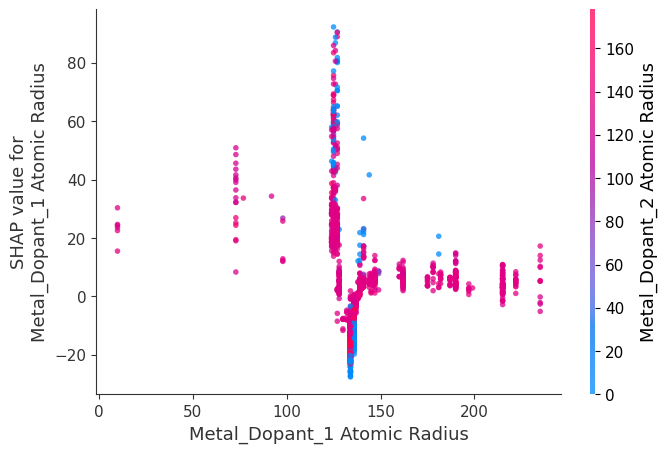

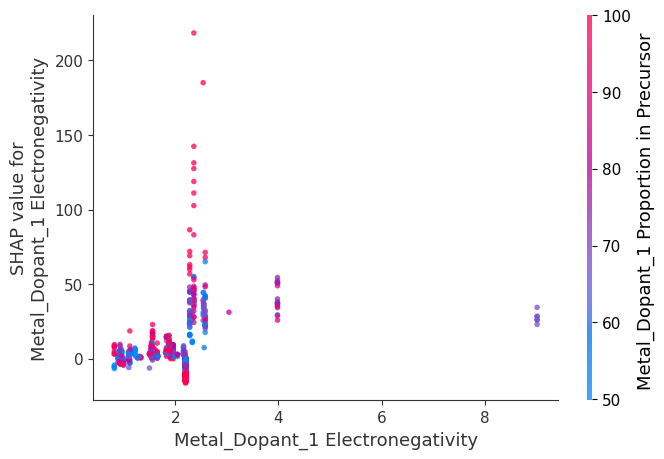

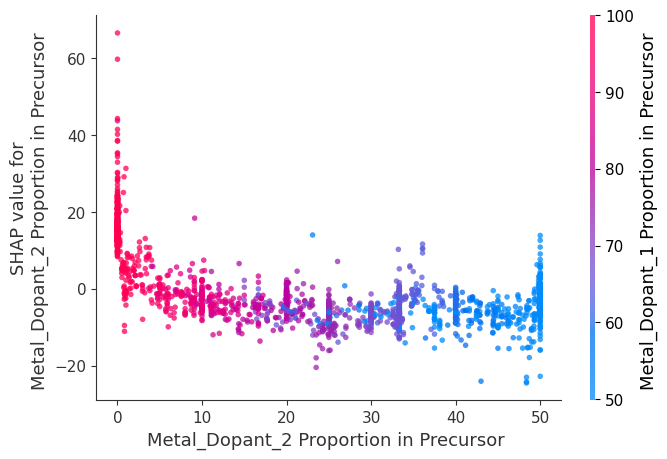

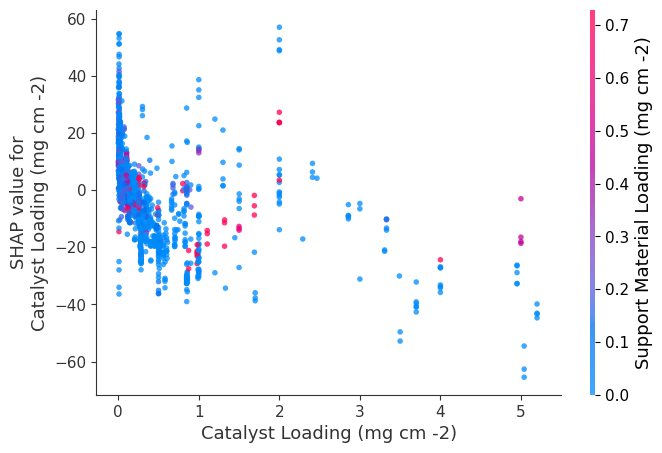

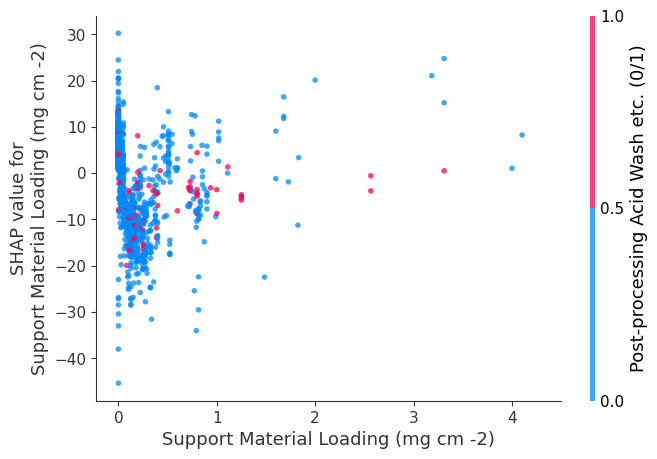

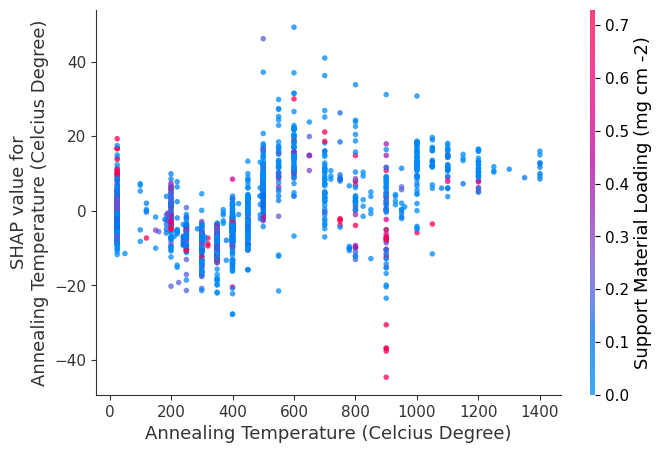

In [38]:
###############################################################################################################
shap.dependence_plot('Metal_Dopant_1 Atomic Radius', weighted_SHAP_ALL.values, data_input_full,
                     interaction_index='Metal_Dopant_2 Atomic Radius',alpha=0.75)
shap.dependence_plot('Metal_Dopant_1 Electronegativity', weighted_SHAP_ALL.values, data_input_full,
                     interaction_index='Metal_Dopant_1 Proportion in Precursor ',alpha=0.75)
shap.dependence_plot('Metal_Dopant_2 Proportion in Precursor ', weighted_SHAP_ALL.values, data_input_full,
                     interaction_index='Metal_Dopant_1 Proportion in Precursor ',alpha=0.75)
###############################################################################################################
shap.dependence_plot('Catalyst Loading (mg cm -2)', weighted_SHAP_ALL.values, data_input_full,xmax=5.5,
                     interaction_index='Support Material Loading (mg cm -2)',alpha=0.75)
shap.dependence_plot('Support Material Loading (mg cm -2)', weighted_SHAP_ALL.values, data_input_full,xmax=4.5,
                     interaction_index='Post-processing Acid Wash etc. (0/1)',alpha=0.75)
shap.dependence_plot('Annealing Temperature (Celcius Degree)', weighted_SHAP_ALL.values, data_input_full,
                     interaction_index='Support Material Loading (mg cm -2)',alpha=0.75)